====================================================================================================================
# PART ONE 
====================================================================================================================

• **DOMAIN:** Automobile

• **CONTEXT:** The data concerns city-cycle fuel consumption in miles per gallon, to be predicted in terms of 3 multivalued discrete and 5 continuous attributes

• **DATA DESCRIPTION:** The data concerns city-cycle fuel consumption in miles per gallon

• **Attribute Information:**

    1. mpg: continuous
    2. cylinders: multi-valued discrete
    3. displacement: continuous
    4. horsepower: continuous
    5. weight: continuous
    6. acceleration: continuous
    7. model year: multi-valued discrete
    8. origin: multi-valued discrete
    9. car name: string (unique for each instance)

In [994]:
#Import Libraries
# To enable plotting graphs in Jupyter notebook
%matplotlib inline 
import numpy as np
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
from os import system
from IPython.display import Image
from sklearn.tree import plot_tree

from scipy.stats import zscore
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(color_codes=True) # adds a nice background to the graphs
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, accuracy_score, precision_score, recall_score,f1_score
import os
from sklearn.preprocessing import LabelEncoder
from scipy import stats
%matplotlib inline
sns.set_style('darkgrid')
%matplotlib inline
from sklearn.preprocessing import MinMaxScaler
from sklearn import model_selection
import warnings
warnings.filterwarnings("ignore")
from collections import Counter
from sklearn.model_selection import cross_val_score
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTENC
from imblearn.over_sampling import SMOTE
# Confusion Matrix
from sklearn import metrics
from sklearn.model_selection import train_test_split, GridSearchCV,RandomizedSearchCV
from math import sqrt
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import cm
from sklearn.cluster import AgglomerativeClustering 
from IPython.display import display
from scipy.spatial.distance import cdist
from pandas.api.types import is_numeric_dtype
from sklearn import svm
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_samples, silhouette_score
from scipy.cluster.hierarchy import cophenet, dendrogram, linkage
from scipy.spatial.distance import pdist  #Pairwise distribution between data points
from scipy.cluster.hierarchy import fcluster
# Import Linear Regression machine learning library
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso




## 1. Import and warehouse data: 

**• Import all the given datasets and explore shape and size.**

**• Merge all datasets onto one and explore final shape and size.**

**• Export the final dataset and store it on local machine in .csv, .xlsx and .json format for future use.**

**• Import the data from above steps into python.**

In [1047]:
cardata_csv = pd.read_csv("Part1 - Car name.csv")

cardata_json = pd.read_json("Part1 - Car-Attributes.json")

In [1048]:
cardata_csv.shape

(398, 1)

cardata_csv has 398 rows and 1 column

In [1049]:
cardata_json.shape

(398, 8)

cardata_json has 398 rows and 8 columns

Now we can check the data with head

In [1050]:
cardata_csv.head()

,car_name
0,chevrolet chevelle malibu
1,buick skylark 320
2,plymouth satellite
3,amc rebel sst
4,ford torino


In [1051]:
cardata_json.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,18.0,8,307.0,130,3504,12.0,70,1
1,15.0,8,350.0,165,3693,11.5,70,1
2,18.0,8,318.0,150,3436,11.0,70,1
3,16.0,8,304.0,150,3433,12.0,70,1
4,17.0,8,302.0,140,3449,10.5,70,1


**• Merge all datasets onto one and explore final shape and size.**


Since we have similar number of rows and data are there in two data file, we can merge with join function.

In [1052]:
cardata=cardata_csv.join(cardata_json)
cardata.head()

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
0,chevrolet chevelle malibu,18.0,8,307.0,130,3504,12.0,70,1
1,buick skylark 320,15.0,8,350.0,165,3693,11.5,70,1
2,plymouth satellite,18.0,8,318.0,150,3436,11.0,70,1
3,amc rebel sst,16.0,8,304.0,150,3433,12.0,70,1
4,ford torino,17.0,8,302.0,140,3449,10.5,70,1


In [1053]:
cardata.shape

(398, 9)

Now we have 398 rows and 9 columns are merging which added the columns

**• Export the final dataset and store it on local machine in .csv, .xlsx and .json format for future use.**

**• Import the data from above steps into python.**

In [1054]:
def save_to_file(file_type,df):
    if file_type == 'csv':
        df.to_csv("car_data.csv")
        res = pd.read_csv("car_data.csv",index_col=0)
    elif file_type == 'xlsx':
        df.to_excel("car_data.xlsx")
        res = pd.read_excel("car_data.xlsx",index_col=0)
    elif file_type == 'json':
        df.to_json("car_data.json")
        res = pd.read_json("car_data.json")
    return res

csv_file = save_to_file("csv", cardata)
csv_file.head()


,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
0,chevrolet chevelle malibu,18.0,8,307.0,130,3504,12.0,70,1
1,buick skylark 320,15.0,8,350.0,165,3693,11.5,70,1
2,plymouth satellite,18.0,8,318.0,150,3436,11.0,70,1
3,amc rebel sst,16.0,8,304.0,150,3433,12.0,70,1
4,ford torino,17.0,8,302.0,140,3449,10.5,70,1


In [1055]:
xlsx_file = save_to_file("xlsx", cardata)
xlsx_file.head()

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
0,chevrolet chevelle malibu,18.0,8,307.0,130,3504,12.0,70,1
1,buick skylark 320,15.0,8,350.0,165,3693,11.5,70,1
2,plymouth satellite,18.0,8,318.0,150,3436,11.0,70,1
3,amc rebel sst,16.0,8,304.0,150,3433,12.0,70,1
4,ford torino,17.0,8,302.0,140,3449,10.5,70,1


In [1056]:
json_file = save_to_file("json", cardata)
json_file.head()

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
0,chevrolet chevelle malibu,18.0,8,307.0,130,3504,12.0,70,1
1,buick skylark 320,15.0,8,350.0,165,3693,11.5,70,1
2,plymouth satellite,18.0,8,318.0,150,3436,11.0,70,1
3,amc rebel sst,16.0,8,304.0,150,3433,12.0,70,1
4,ford torino,17.0,8,302.0,140,3449,10.5,70,1


## 2. Data cleansing:

**• Missing/incorrect value treatment**

**• Drop attribute/s if required using relevant functional knowledge**

**• Perform another kind of corrections/treatment on the data.**

In [1057]:
cardata.isna().sum()

car_name    0
mpg         0
cyl         0
disp        0
hp          0
wt          0
acc         0
yr          0
origin      0
dtype: int64

In [1058]:
cardata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   car_name  398 non-null    object 
 1   mpg       398 non-null    float64
 2   cyl       398 non-null    int64  
 3   disp      398 non-null    float64
 4   hp        398 non-null    object 
 5   wt        398 non-null    int64  
 6   acc       398 non-null    float64
 7   yr        398 non-null    int64  
 8   origin    398 non-null    int64  
dtypes: float64(3), int64(4), object(2)
memory usage: 28.1+ KB


In [1060]:
cardata[cardata['hp']=="?"]

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
32,ford pinto,25.0,4,98.0,?,2046,19.0,71,1
126,ford maverick,21.0,6,200.0,?,2875,17.0,74,1
330,renault lecar deluxe,40.9,4,85.0,?,1835,17.3,80,2
336,ford mustang cobra,23.6,4,140.0,?,2905,14.3,80,1
354,renault 18i,34.5,4,100.0,?,2320,15.8,81,2
374,amc concord dl,23.0,4,151.0,?,3035,20.5,82,1


**Lets see the dristribution of hp**

In [1061]:
cardata['hp'].replace("?",np.nan, inplace=True)

In [1062]:
hp = cardata['hp'].dropna()
hp.count()

392

<AxesSubplot:xlabel='hp', ylabel='Density'>

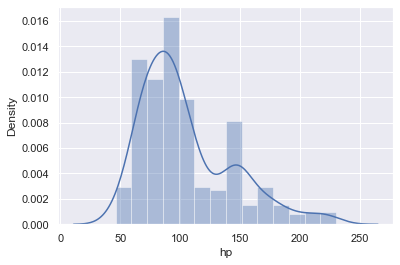

In [1063]:
sns.distplot(pd.to_numeric(hp))

In [1064]:
# Since this does not look to be normally distributed, let us impute by using median
cardata['hp'].fillna((cardata['hp'].median()), inplace=True)
cardata['hp'] = cardata['hp'].astype('float')

In [1065]:
cardata.shape

(398, 9)

In [1066]:
cardata.dtypes

car_name     object
mpg         float64
cyl           int64
disp        float64
hp          float64
wt            int64
acc         float64
yr            int64
origin        int64
dtype: object

In [1067]:
cardata.nunique()

car_name    305
mpg         129
cyl           5
disp         82
hp           94
wt          351
acc          95
yr           13
origin        3
dtype: int64

**Year would be more effective if we can transorm this to calculate age of vehicle. Since the year of collection of data is not given lets consider max year as the final year**

In [1068]:
cardata["yr"].max()

82

In [1069]:
cardata['age'] = 82-cardata['yr']

In [1070]:
cardata = cardata.drop(['yr'], axis =1)

cardata.head()

,car_name,mpg,cyl,disp,hp,wt,acc,origin,age
0,chevrolet chevelle malibu,18.0,8,307.0,130.0,3504,12.0,1,12
1,buick skylark 320,15.0,8,350.0,165.0,3693,11.5,1,12
2,plymouth satellite,18.0,8,318.0,150.0,3436,11.0,1,12
3,amc rebel sst,16.0,8,304.0,150.0,3433,12.0,1,12
4,ford torino,17.0,8,302.0,140.0,3449,10.5,1,12


In [1071]:
car_data_before_encoding = cardata.copy()

**Origin as pointed earlier indicates production point so should be broken into dummy variables**

In [1072]:
cardata['origin'].nunique()

3

In [1073]:
one_hot = pd.get_dummies(cardata['origin'],drop_first = True)
one_hot = one_hot.add_prefix('origin_')

cardata = cardata.join(one_hot)
cardata.head()



,car_name,mpg,cyl,disp,hp,wt,acc,origin,age,origin_2,origin_3
0,chevrolet chevelle malibu,18.0,8,307.0,130.0,3504,12.0,1,12,0,0
1,buick skylark 320,15.0,8,350.0,165.0,3693,11.5,1,12,0,0
2,plymouth satellite,18.0,8,318.0,150.0,3436,11.0,1,12,0,0
3,amc rebel sst,16.0,8,304.0,150.0,3433,12.0,1,12,0,0
4,ford torino,17.0,8,302.0,140.0,3449,10.5,1,12,0,0


In [1074]:
# Removing duplicate/irrelevant columns

car_new = cardata.drop(['origin','car_name'], axis =1)

car_new.head()

,mpg,cyl,disp,hp,wt,acc,age,origin_2,origin_3
0,18.0,8,307.0,130.0,3504,12.0,12,0,0
1,15.0,8,350.0,165.0,3693,11.5,12,0,0
2,18.0,8,318.0,150.0,3436,11.0,12,0,0
3,16.0,8,304.0,150.0,3433,12.0,12,0,0
4,17.0,8,302.0,140.0,3449,10.5,12,0,0


In [1075]:
car_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   mpg       398 non-null    float64
 1   cyl       398 non-null    int64  
 2   disp      398 non-null    float64
 3   hp        398 non-null    float64
 4   wt        398 non-null    int64  
 5   acc       398 non-null    float64
 6   age       398 non-null    int64  
 7   origin_2  398 non-null    uint8  
 8   origin_3  398 non-null    uint8  
dtypes: float64(4), int64(3), uint8(2)
memory usage: 22.7 KB


## 3. Data analysis & visualisation: 

**• Perform detailed statistical analysis on the data.**

**• Perform a detailed univariate, bivariate and multivariate analysis with appropriate detailed comments after each analysis.**

In [1076]:
car_new.describe()

,mpg,cyl,disp,hp,wt,acc,age,origin_2,origin_3
count,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000
mean,23.514573,5.454774,193.425879,104.304020,2970.424623,15.568090,5.989950,0.175879,0.198492
std,7.815984,1.701004,104.269838,38.222625,846.841774,2.757689,3.697627,0.381197,0.399367
min,9.000000,3.000000,68.000000,46.000000,1613.000000,8.000000,0.000000,0.000000,0.000000
25%,17.500000,4.000000,104.250000,76.000000,2223.750000,13.825000,3.000000,0.000000,0.000000
50%,23.000000,4.000000,148.500000,93.500000,2803.500000,15.500000,6.000000,0.000000,0.000000
75%,29.000000,8.000000,262.000000,125.000000,3608.000000,17.175000,9.000000,0.000000,0.000000
max,46.600000,8.000000,455.000000,230.000000,5140.000000,24.800000,12.000000,1.000000,1.000000


### Descriptive analysis

MPG : Here we can see that the mpg mean and the median are almost same, which can say that the data is normally distributed. Very little skewness is there. 

Following similar mean and median relationship, columns like cyl, disp, hp have skewness. While data like wt, acc, yr have very little skewness.



In [1077]:
print("Skewness: %f" % car_new['mpg'].skew())
print("Kurtosis: %f" % car_new['mpg'].kurt())

Skewness: 0.457066
Kurtosis: -0.510781


## Univariate Analysis

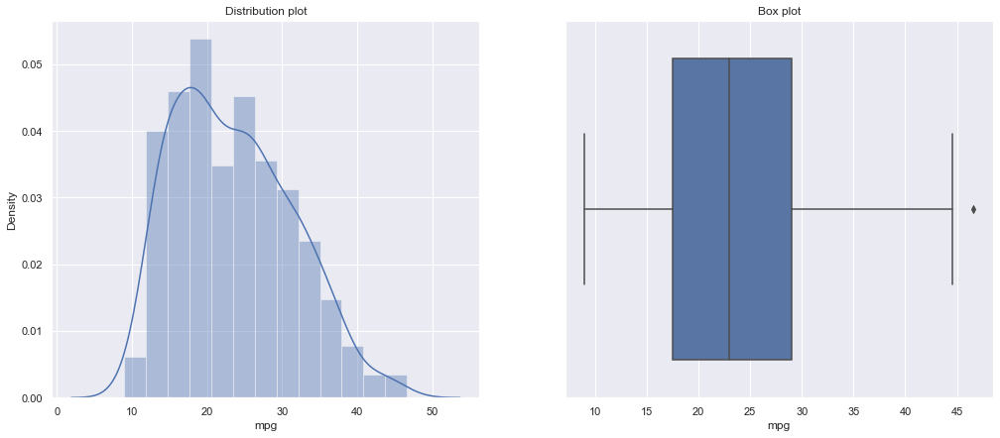

Total Number of outliers in mpg: 1


In [1078]:
def univariate_analysis_boxplot_distplot(dataset, criteria):
    f, axes = plt.subplots(1, 2, figsize=(17,7))
    sns.boxplot(x = criteria, data=dataset,  orient='h' , ax=axes[1])
    sns.distplot(dataset[criteria],  ax=axes[0])
    axes[0].set_title('Distribution plot')
    axes[1].set_title('Box plot')
    plt.show()
    #checking count of outliers.
    q25,q75=np.percentile(dataset[criteria],25),np.percentile(dataset[criteria],75)
    IQR=q75-q25
    Threshold=IQR*1.5
    lower,upper=q25-Threshold,q75+Threshold
    Outliers=[i for i in dataset[criteria] if i < lower or i > upper]
    
    print(f'Total Number of outliers in {criteria}: {len(Outliers)}')

univariate_analysis_boxplot_distplot(car_new, 'mpg')

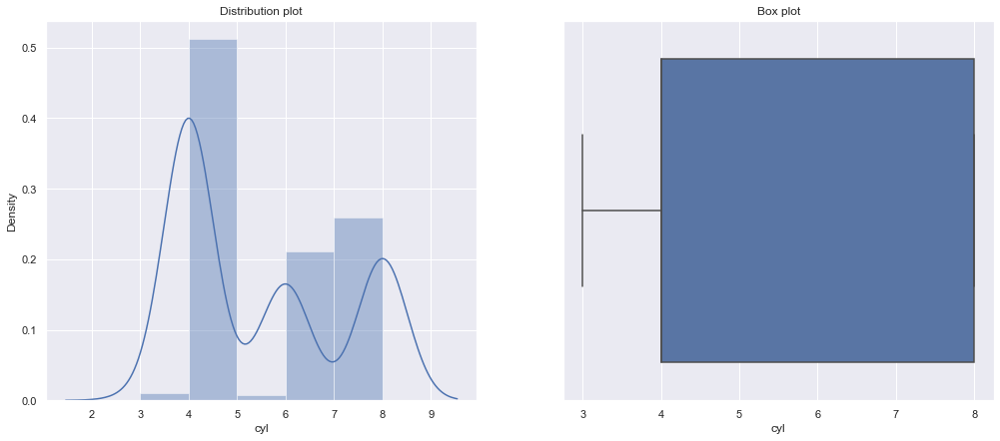

Total Number of outliers in cyl: 0


In [1079]:
univariate_analysis_boxplot_distplot(car_new, 'cyl')

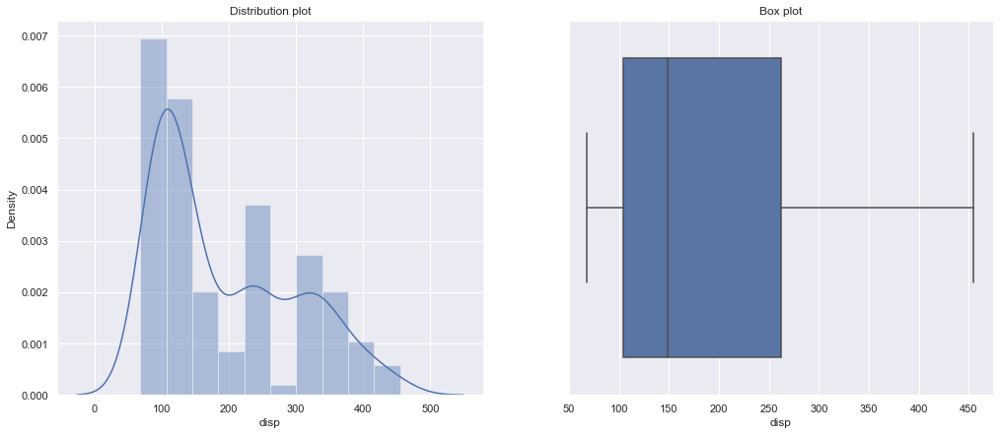

Total Number of outliers in disp: 0


In [1080]:
univariate_analysis_boxplot_distplot(car_new, 'disp')

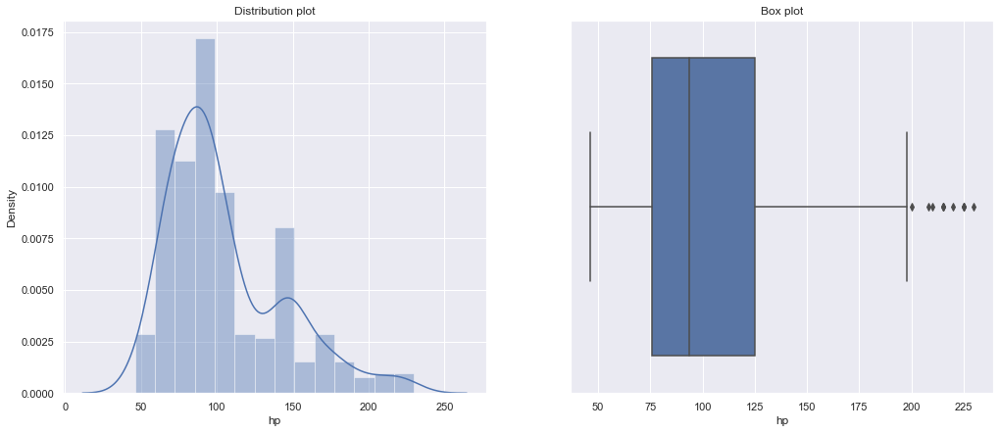

Total Number of outliers in hp: 11


In [1081]:
univariate_analysis_boxplot_distplot(car_new, 'hp')

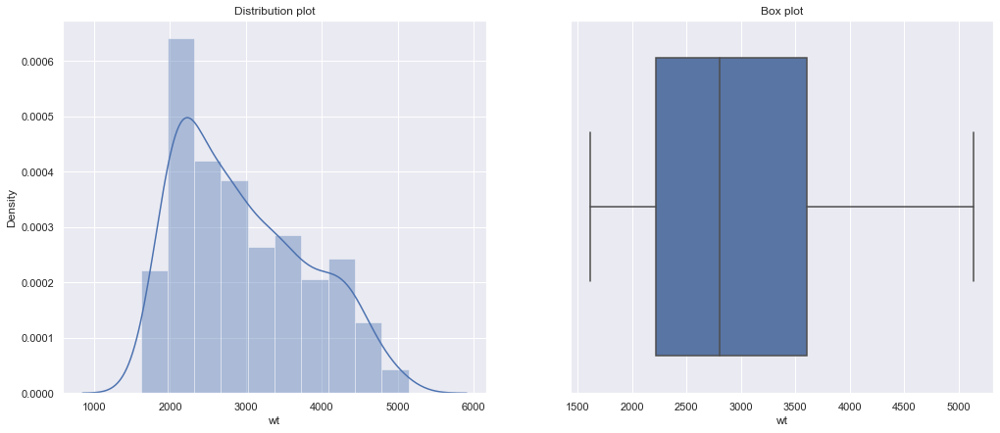

Total Number of outliers in wt: 0


In [1082]:
univariate_analysis_boxplot_distplot(car_new, 'wt')

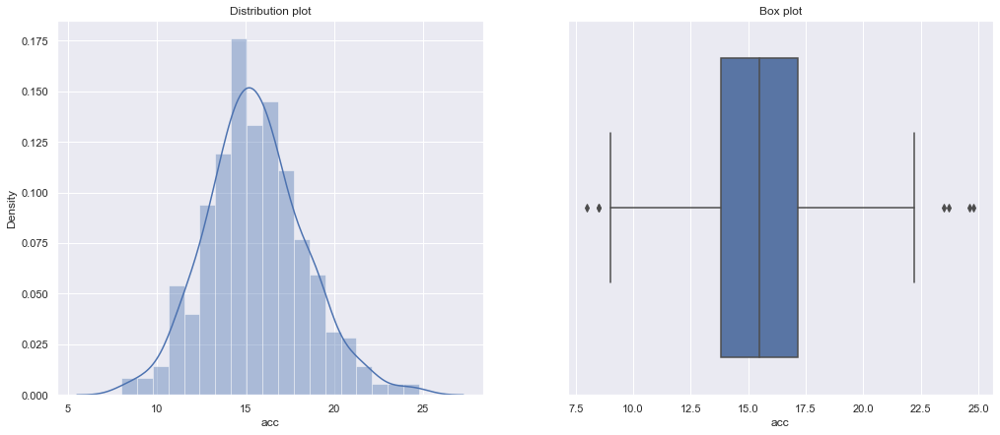

Total Number of outliers in acc: 7


In [1083]:
univariate_analysis_boxplot_distplot(car_new, 'acc')

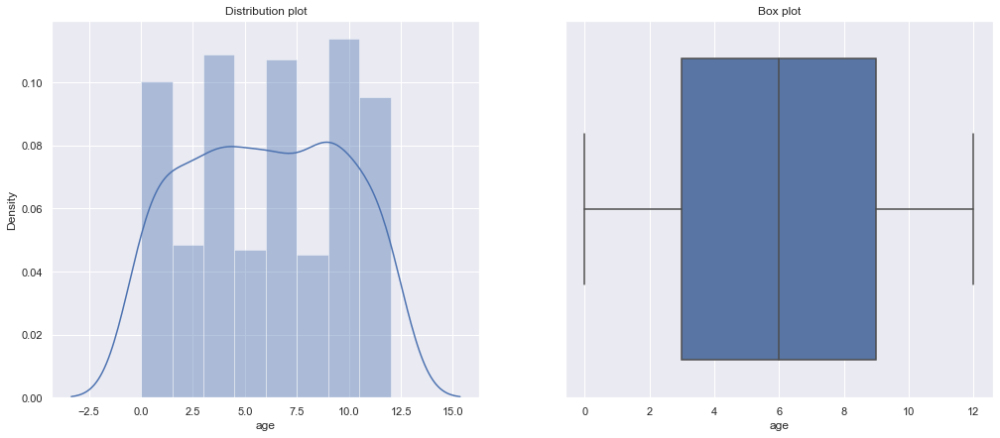

Total Number of outliers in age: 0


In [1084]:
univariate_analysis_boxplot_distplot(car_new, 'age')

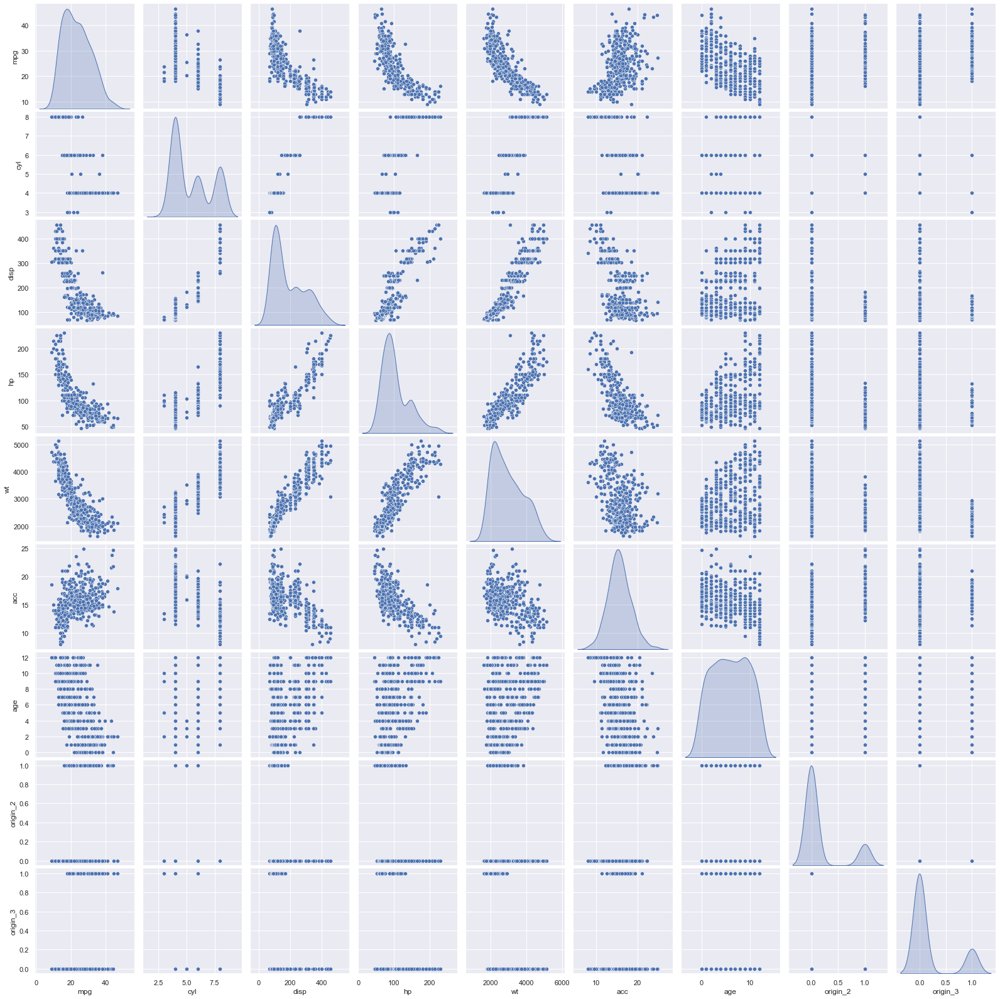

In [1085]:
sns.pairplot(car_new,diag_kind='kde')

Observations:

1. acc,mpg are nearly normal
2. cyl and disp shows 3 clusters, which indicates there might be 3 gaussians
3. wt column shows 2 cluster which indicates 2 gaussian.
3. From bivariate plots we can see that mps shows negative liner relationship with wt,hp and disp and same is seen in correlation.
4. For age criteria we see two peaks 
5. Cyl too shows negative correlation with levels
7. With increase in cylinder,  mpg seems to be going down.
8. With increase in displacement,  mpg seems to be going down. This is as expected in real life scenario 
9. With increase in hp,  mpg seems to be going down. This is as expected in real life scenario 
10. Acc vs mpg shows cloud like graph, which indicates weak relationship
11. There is likelihood of 3 clusters.




In [1086]:
car_new.groupby(car_new['cyl']).mean()

,mpg,disp,hp,wt,acc,age,origin_2,origin_3
cyl,,,,,,,,
3,20.550000,72.500000,99.250000,2398.500000,13.250000,6.500000,0.000000,1.000000
4,29.286765,109.796569,78.654412,2308.127451,16.601471,4.926471,0.308824,0.338235
5,27.366667,145.000000,82.333333,3103.333333,18.633333,3.000000,1.000000,0.000000
6,19.985714,218.142857,101.410714,3198.226190,16.263095,6.071429,0.047619,0.071429
8,14.963107,345.009709,158.300971,4114.718447,12.955340,8.097087,0.000000,0.000000


<AxesSubplot:>

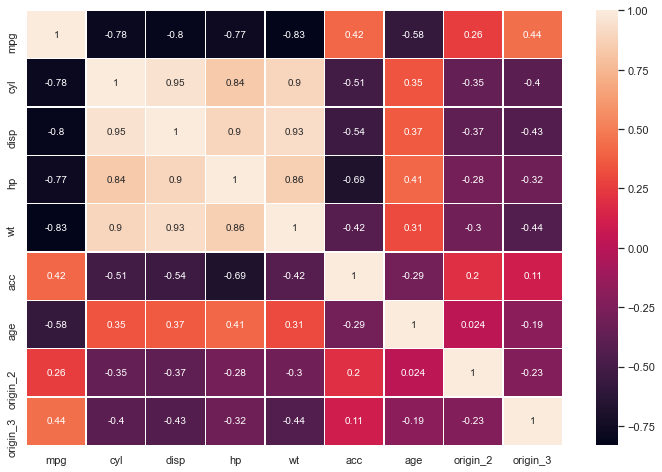

In [1087]:
corr=car_new.corr()
fig, ax=plt.subplots(1,1,figsize=(12,8))
sns.heatmap(corr,annot=True, linewidth=.5, ax=ax)

**There is high negative correlation between mpg and variable like cyl,disp,hp,wt**

**Bellow features are highly correlated among each other: cyl, disp, hp, wt**

**With increase in cylinder mpg seems to be going down.**

**With increase in displacement,  mpg seems to be going down. This is as expected in real life scenario**

**With increase in hp,  mpg seems to be going down. This is as expected in real life scenario**

**Acc vs mpg shows cloud like graph, which indicates weak relationship**

**Removing Outliers**

Lets check for outliers


<AxesSubplot:>

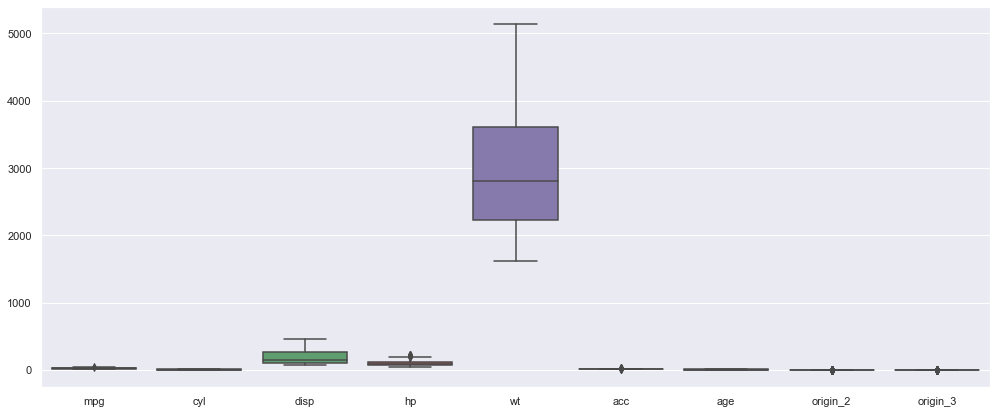

In [1088]:
f, axes = plt.subplots( figsize=(17,7))
sns.boxplot( data=car_new )

In [1089]:
def check_outliers():
    col=list(car_new.select_dtypes(include=['int64','float64']).columns)

    for c in col:
        #getting upper lower quartile values
        q25,q75=np.percentile(car_new[c],25),np.percentile(car_new[c],75)
        IQR=q75-q25
        Threshold=IQR*1.5
        lower,upper=q25-Threshold,q75+Threshold
        Outliers=[i for i in car_new[c] if i < lower or i > upper]
        print('{} Total Number of outliers in {} : {}'.format('\033[1m',c,len(Outliers)))

check_outliers()

 Total Number of outliers in mpg : 1
 Total Number of outliers in cyl : 0
 Total Number of outliers in disp : 0
 Total Number of outliers in hp : 11
 Total Number of outliers in wt : 0
 Total Number of outliers in acc : 7
 Total Number of outliers in age : 0


**Using logaritmic transform for hp,mpg and acc to remove outliers**

In [1090]:
car_new['hp'] = np.log(car_new['hp'])
car_new['acc'] = np.log(car_new['acc'])
car_new['mpg'] = np.log(car_new['mpg'])

car_new.head()

,mpg,cyl,disp,hp,wt,acc,age,origin_2,origin_3
0,2.890372,8,307.0,4.867534,3504,2.484907,12,0,0
1,2.708050,8,350.0,5.105945,3693,2.442347,12,0,0
2,2.890372,8,318.0,5.010635,3436,2.397895,12,0,0
3,2.772589,8,304.0,5.010635,3433,2.484907,12,0,0
4,2.833213,8,302.0,4.941642,3449,2.351375,12,0,0


<AxesSubplot:>

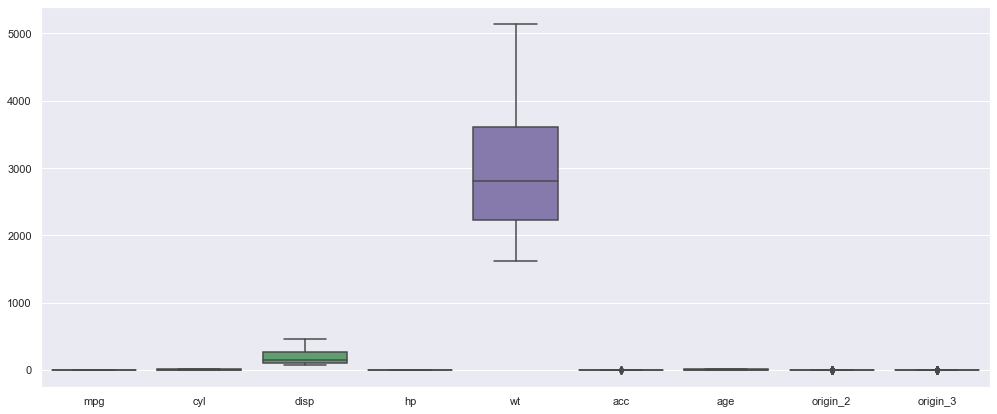

In [1091]:
f, axes = plt.subplots( figsize=(17,7))
sns.boxplot( data=car_new )

In [1092]:
col=list(car_new.select_dtypes(include=['int64','float64']).columns)

for c in col:
    #getting upper lower quartile values
    q25,q75=np.percentile(car_new[c],25),np.percentile(car_new[c],75)
    IQR=q75-q25
    Threshold=IQR*1.5
    lower,upper=q25-Threshold,q75+Threshold
    Outliers=[i for i in car_new[c] if i < lower or i > upper]
    print('{} Total Number of outliers in {} : {}'.format('\033[1m',c,len(Outliers)))

 Total Number of outliers in mpg : 0
 Total Number of outliers in cyl : 0
 Total Number of outliers in disp : 0
 Total Number of outliers in hp : 0
 Total Number of outliers in wt : 0
 Total Number of outliers in acc : 8
 Total Number of outliers in age : 0


**Other continuous variables should be checked for outliers and should be normlized using z-score**

In [1093]:
df_car= car_new.copy()


car_new.dtypes
numeric_cols = car_new.select_dtypes(include=[np.int64, np.float64]).columns
numeric_cols
car_new[numeric_cols] =car_new[numeric_cols].apply(zscore)
car_new.head()

,mpg,cyl,disp,hp,wt,acc,age,origin_2,origin_3
0,-0.622035,1.498191,1.090604,0.823608,0.630870,-1.353748,1.627426,0,0
1,-1.159493,1.498191,1.503514,1.523992,0.854333,-1.589535,1.627426,0,0
2,-0.622035,1.498191,1.196232,1.243998,0.550470,-1.835805,1.627426,0,0
3,-0.969242,1.498191,1.061796,1.243998,0.546923,-1.353748,1.627426,0,0
4,-0.790530,1.498191,1.042591,1.041316,0.565841,-2.093533,1.627426,0,0


## 4. Machine learning: 
**• Use K Means and Hierarchical clustering to find out the optimal number of clusters in the data.**

**• Share your insights about the difference in using these two methods.**

## K-Mean 

**Now, we will use K-Means clustering to group data based on their attribute. First, we need to determine the optimal number of groups. For that we conduct the knee test to see where the knee happens.**

,num_clusters,cluster_errors
0,1,2907.007538
1,2,1366.758642
2,3,1014.435914
3,4,818.541192
4,5,742.515905
5,6,692.677815
6,7,629.145401
7,8,585.715304
8,9,547.345747


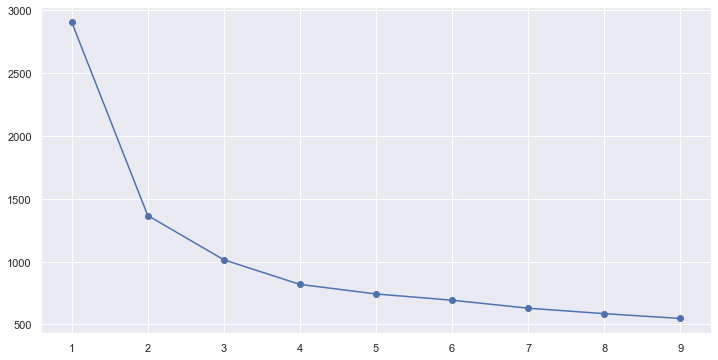

In [1094]:
def kmean_clustering():
    cluster_range = range(1,10)
    cluster_errors = []
    for num_clusters in cluster_range:
        clusters = KMeans(num_clusters, n_init = 5)
        clusters.fit(car_new)
        labels = clusters.labels_
        centroids = clusters.cluster_centers_
        cluster_errors.append(clusters.inertia_)

    clusters_df = pd.DataFrame({"num_clusters": cluster_range, "cluster_errors": cluster_errors})
    display(clusters_df[0:10])
    plt.figure(figsize=(12,6))
    plt.plot( clusters_df.num_clusters, clusters_df.cluster_errors, marker = "o" )
kmean_clustering()

**We can see that after 4 node there is minor changes in error. Hence we can consider 4 clusters**

In [1095]:
kmeans = KMeans(n_clusters=4, n_init = 5, random_state=12345)
kmeans.fit(car_new)
prediction=kmeans.predict(car_new)
kmeans.inertia_

818.4570329845308

In [1096]:
labels = kmeans.labels_
silhouette_score(car_new,labels)

0.32626749496530005

**Here we can see that silhouette_score is around 0.4176**

**Lets Compare silhouette_score for different n**


FOR n= 2 ::
Inertia = 1366.8389735054902
Silhouette_score = 0.4511889534372072



FOR n= 3 ::
Inertia = 1014.5017454129314
Silhouette_score = 0.3387598488728533



FOR n= 4 ::
Inertia = 818.4570329845308
Silhouette_score = 0.32626749496530005



FOR n= 5 ::
Inertia = 741.6130424915295
Silhouette_score = 0.3014982377352664





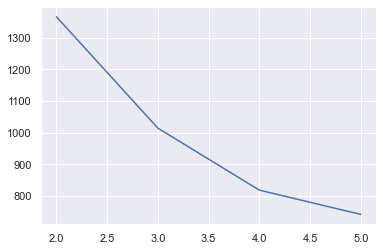

In [1097]:
wss=[]
for i in range(2,6):
    kmean = KMeans(n_clusters=i, n_init = 5, random_state=12345)
    kmean.fit(car_new)
    print(f"FOR n= {i} ::")
    print(f"Inertia = {kmean.inertia_}")
    wss.append(kmean.inertia_)
    labels = kmean.labels_
    print(f"Silhouette_score = {silhouette_score(car_new,labels)}")
    print("\n\n")

    
plt.plot(range(2,6), wss)


**WSS reduces as K keeps increasing**

In [1098]:
#Append the prediction 
df_car["GROUP"] = prediction
print("Groups Assigned : \n")
df_car.head()

Groups Assigned : 



,mpg,cyl,disp,hp,wt,acc,age,origin_2,origin_3,GROUP
0,2.890372,8,307.0,4.867534,3504,2.484907,12,0,0,3
1,2.708050,8,350.0,5.105945,3693,2.442347,12,0,0,3
2,2.890372,8,318.0,5.010635,3436,2.397895,12,0,0,3
3,2.772589,8,304.0,5.010635,3433,2.484907,12,0,0,3
4,2.833213,8,302.0,4.941642,3449,2.351375,12,0,0,3


In [1099]:
df_car['GROUP'].value_counts()

1    116
2     96
3     94
0     92
Name: GROUP, dtype: int64

array([[<AxesSubplot:title={'center':'acc'}, xlabel='[GROUP]'>,
        <AxesSubplot:title={'center':'age'}, xlabel='[GROUP]'>,
        <AxesSubplot:title={'center':'cyl'}, xlabel='[GROUP]'>],
       [<AxesSubplot:title={'center':'disp'}, xlabel='[GROUP]'>,
        <AxesSubplot:title={'center':'hp'}, xlabel='[GROUP]'>,
        <AxesSubplot:title={'center':'mpg'}, xlabel='[GROUP]'>],
       [<AxesSubplot:title={'center':'origin_2'}, xlabel='[GROUP]'>,
        <AxesSubplot:title={'center':'origin_3'}, xlabel='[GROUP]'>,
        <AxesSubplot:title={'center':'wt'}, xlabel='[GROUP]'>]],
      dtype=object)

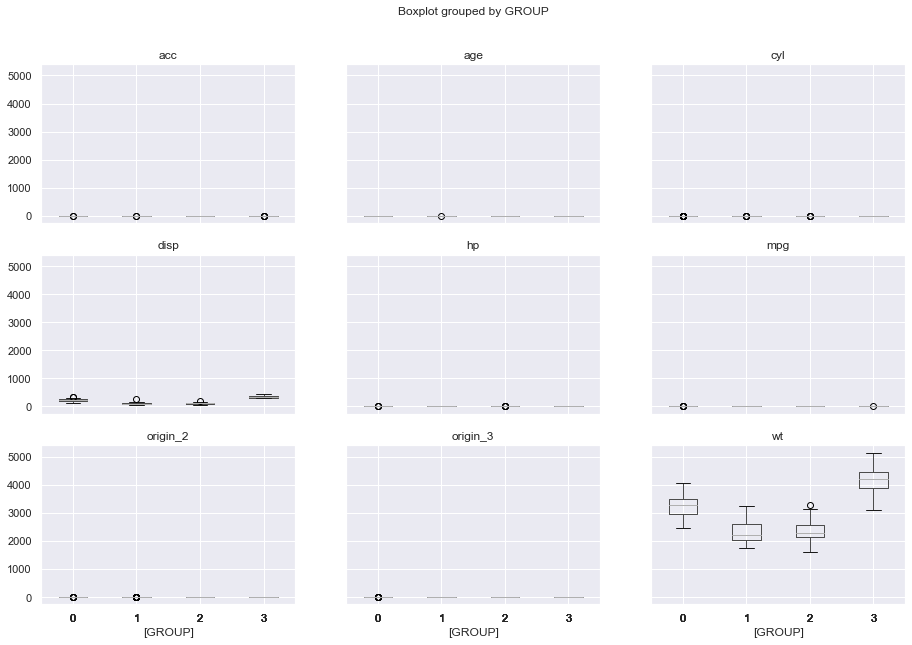

In [1100]:
df_car.boxplot(by='GROUP', layout = (3,3),figsize=(15,10))

In [1101]:
car_new_clust = df_car.groupby(['GROUP'])
car_new_clust.mean()

,mpg,cyl,disp,hp,wt,acc,age,origin_2,origin_3
GROUP,,,,,,,,,
0,2.973389,6.173913,224.597826,4.626906,3252.336957,2.784234,5.826087,0.054348,0.065217
1,3.470020,4.034483,111.655172,4.307040,2317.577586,2.808209,2.008621,0.181034,0.405172
2,3.212514,3.989583,109.005208,4.406756,2326.302083,2.784465,8.468750,0.458333,0.270833
3,2.658249,8.000000,350.042553,5.078259,4157.978723,2.521642,8.531915,0.000000,0.000000


**Cluster 0: Here mean mpg is lesser than group 1 and 2, with avg of 6.17 cyl**

**Cluster 1: These are vehicles with highest mean mpg**

**Cluster 2: These are on higher end of mean mpg but lesser than cluster 1**

**Cluster 3: These are vehicles with least mean mpg**

In [1103]:
kmeans3 = KMeans(n_clusters=3, n_init = 5, random_state=12345)
kmeans3.fit(car_new)
prediction3=kmeans3.predict(car_new)
labels3 = kmeans3.labels_
#Append the prediction 
df_car_3= df_car.copy().drop(["GROUP"],axis=1)
df_car_3["GROUP"] = prediction3
car_new_clust_3 = df_car_3.groupby(['GROUP'])
car_new_clust_3.mean()

,mpg,cyl,disp,hp,wt,acc,age,origin_2,origin_3
GROUP,,,,,,,,,
0,2.972900,6.082474,220.154639,4.625334,3237.350515,2.785332,5.969072,0.092784,0.061856
1,3.362822,4.004831,109.780193,4.346296,2306.067633,2.797262,4.845411,0.294686,0.352657
2,2.658249,8.000000,350.042553,5.078259,4157.978723,2.521642,8.531915,0.000000,0.000000


**Cluster 0: MEDIUM RANGE MPG CARS (medium mpg, medium wt, medium acceration): Here mean mpg is average or in between c1 and c2**

**Cluster 1: HIGH RANGE MPG CARS (high mpg, less wt, high acceration): These are vehicles with highest mean mpg, lesser weight and high acceleration**

**Cluster 2: SMALL RANGE MPG CARS (lower mpg, high wt, lower acceration): These are vehicles with least mean mpg but mean weight are more.**

## Hierarchical clustering

In [1104]:
car_hier=car_new.copy()
model = AgglomerativeClustering(n_clusters=3, affinity='euclidean',  linkage='average')
model.fit(car_hier)
car_hier['labels'] = model.labels_
car_hier.head(10)
    

,mpg,cyl,disp,hp,wt,acc,age,origin_2,origin_3,labels
0,-0.622035,1.498191,1.090604,0.823608,0.630870,-1.353748,1.627426,0,0,1
1,-1.159493,1.498191,1.503514,1.523992,0.854333,-1.589535,1.627426,0,0,1
2,-0.622035,1.498191,1.196232,1.243998,0.550470,-1.835805,1.627426,0,0,1
3,-0.969242,1.498191,1.061796,1.243998,0.546923,-1.353748,1.627426,0,0,1
4,-0.790530,1.498191,1.042591,1.041316,0.565841,-2.093533,1.627426,0,0,1
5,-1.159493,1.498191,2.262118,2.059602,1.620492,-2.363838,1.627426,0,0,1
6,-1.362874,1.498191,2.502182,2.369121,1.635863,-2.947553,1.627426,0,0,1
7,-1.362874,1.498191,2.367746,2.301584,1.586204,-3.264219,1.627426,0,0,1
8,-1.362874,1.498191,2.511784,2.435140,1.719809,-2.363838,1.627426,0,0,1
9,-1.159493,1.498191,1.887617,1.938441,1.039961,-3.264219,1.627426,0,0,1


In [1105]:
car_hier_clust = car_hier.groupby(['labels'])
car_hier_clust.mean()

,mpg,cyl,disp,hp,wt,acc,age,origin_2,origin_3
labels,,,,,,,,,
0,0.736874,-0.853544,-0.803436,-0.689024,-0.762992,0.382046,-0.292331,0.316038,0.344340
1,-1.265067,1.498191,1.471118,1.401433,1.369119,-1.099915,0.626346,0.000000,0.000000
2,-0.356043,0.375062,0.283767,0.084268,0.301281,0.320665,-0.000391,0.034483,0.068966


In [1106]:
Z = linkage(car_hier, metric='euclidean', method='average')
c, coph_dists = cophenet(Z , pdist(car_hier))

c

0.7789495979974345

**Cophenetic score for (n =3) =0.77894**

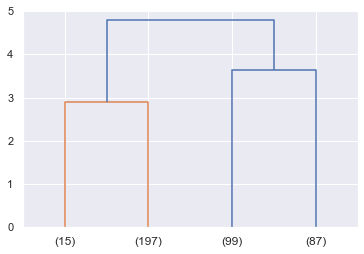

In [1107]:
dendrogram(
    Z,
    truncate_mode='lastp',  
    p=4,  
)
plt.show()

In [1108]:
Z = linkage(car_hier, metric='euclidean', method='complete')
c, coph_dists = cophenet(Z , pdist(car_hier))

c

0.7630935050742287

**Cophenetic score for (n =4) =0.7631**

**Since cluster 3 has btter cophentic coefficients than 4, we can go with n=3**

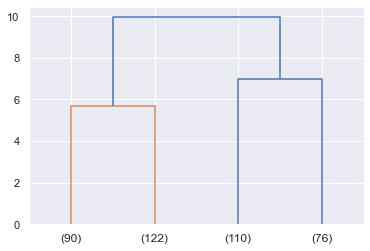

In [1109]:
dendrogram(
    Z,
    truncate_mode='lastp',  
    p=4,  
)
plt.show()

In [1110]:
car_hier2=car_new.copy()

Z = linkage(car_hier, metric='euclidean', method='average')
c, coph_dists = cophenet(Z , pdist(car_hier))
c

0.7789495979974345

In [1111]:
clusters_hier = fcluster(Z, 3, criterion='maxclust')
clusters_hier

array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 3, 3, 3, 1, 1, 1, 1,
       1, 1, 3, 2, 2, 2, 2, 1, 1, 1, 1, 3, 3, 3, 3, 3, 2, 2, 2, 2, 2, 2,
       2, 3, 1, 3, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 1, 2, 2, 2, 2, 3, 1, 1,
       1, 1, 1, 3, 1, 2, 2, 1, 1, 1, 1, 2, 1, 3, 2, 3, 3, 3, 3, 1, 1, 1,
       1, 3, 3, 3, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 3,
       3, 3, 2, 2, 2, 2, 3, 3, 3, 3, 3, 2, 2, 1, 1, 3, 1, 1, 1, 1, 3, 1,
       3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 3, 1, 1, 1,
       1, 3, 3, 3, 3, 1, 1, 1, 1, 1, 2, 1, 3, 3, 2, 2, 2, 2, 1, 1, 1, 1,
       1, 2, 3, 2, 2, 3, 3, 3, 3, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 3,
       1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 3, 3, 3, 1, 3, 3, 3, 3, 3, 3, 2, 3,
       2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 3, 1, 1, 3, 3, 1, 3, 3, 2,
       2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 3, 1, 3,

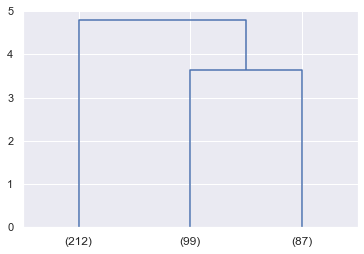

In [1112]:
dendrogram(
    Z,
    truncate_mode='lastp',  
    p=3,  
)
plt.show()

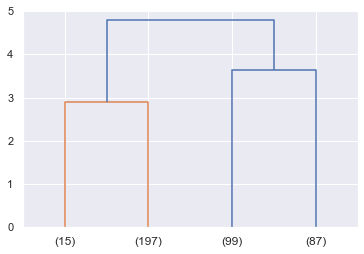

In [1113]:
dendrogram(
    Z,
    truncate_mode='lastp',  
    p=4,  
)
plt.show()

In [1114]:
car_hier2['clusters'] = clusters_hier
car_hier2

,mpg,cyl,disp,hp,wt,acc,age,origin_2,origin_3,clusters
0,-0.622035,1.498191,1.090604,0.823608,0.630870,-1.353748,1.627426,0,0,2
1,-1.159493,1.498191,1.503514,1.523992,0.854333,-1.589535,1.627426,0,0,2
2,-0.622035,1.498191,1.196232,1.243998,0.550470,-1.835805,1.627426,0,0,2
3,-0.969242,1.498191,1.061796,1.243998,0.546923,-1.353748,1.627426,0,0,2
4,-0.790530,1.498191,1.042591,1.041316,0.565841,-2.093533,1.627426,0,0,2
...,...,...,...,...,...,...,...,...,...,...
393,0.573219,-0.856321,-0.513026,-0.390219,-0.213324,0.099793,-1.621983,0,0,1
394,2.012814,-0.856321,-0.925936,-1.868196,-0.993671,2.623200,-1.621983,1,0,1
395,1.074057,-0.856321,-0.561039,-0.459345,-0.798585,-1.541568,-1.621983,0,0,1
396,0.680426,-0.856321,-0.705077,-0.639630,-0.408411,1.074255,-1.621983,0,0,1


In [1115]:
car_hier2.clusters.value_counts().sort_index()

1    212
2     99
3     87
Name: clusters, dtype: int64

array([[<AxesSubplot:title={'center':'acc'}, xlabel='[clusters]'>,
        <AxesSubplot:title={'center':'age'}, xlabel='[clusters]'>,
        <AxesSubplot:title={'center':'cyl'}, xlabel='[clusters]'>],
       [<AxesSubplot:title={'center':'disp'}, xlabel='[clusters]'>,
        <AxesSubplot:title={'center':'hp'}, xlabel='[clusters]'>,
        <AxesSubplot:title={'center':'mpg'}, xlabel='[clusters]'>],
       [<AxesSubplot:title={'center':'origin_2'}, xlabel='[clusters]'>,
        <AxesSubplot:title={'center':'origin_3'}, xlabel='[clusters]'>,
        <AxesSubplot:title={'center':'wt'}, xlabel='[clusters]'>]],
      dtype=object)

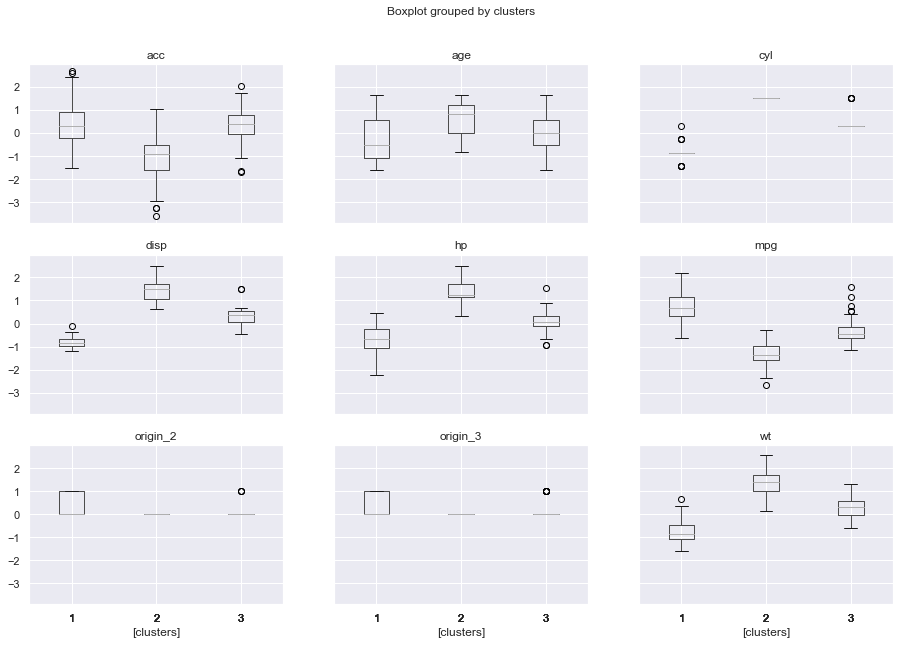

In [1116]:
car_hier2.boxplot(by='clusters', layout = (3,3),figsize=(15,10))

In [1117]:
aggdata=car_hier2.groupby('clusters').mean()
aggdata['Freq']=car_hier2.clusters.value_counts().sort_index()
aggdata

,mpg,cyl,disp,hp,wt,acc,age,origin_2,origin_3,Freq
clusters,,,,,,,,,,
1,0.736874,-0.853544,-0.803436,-0.689024,-0.762992,0.382046,-0.292331,0.316038,0.344340,212
2,-1.265067,1.498191,1.471118,1.401433,1.369119,-1.099915,0.626346,0.000000,0.000000,99
3,-0.356043,0.375062,0.283767,0.084268,0.301281,0.320665,-0.000391,0.034483,0.068966,87


**Cluster 1: HIGH RANGE MPG CARS (high mpg, less wt, high acceration): These are vehicles with highest mean mpg, lesser weight and high acceleration**

**Cluster 2: SMALL RANGE MPG CARS (lower mpg, high wt, lower acceration): These are vehicles with least mean mpg but mean weight are more.**

**Cluster 3: MEDIUM RANGE MPG CARS (medium mpg, medium wt, medium acceration): Here mean mpg is average or in between c1 and c2**



## 5. Answer below questions based on outcomes of using ML based methods. 

**• Mention how many optimal clusters are present in the data and what could be the possible reason behind it.**

**• Use linear regression model on different clusters separately and print the coefficients of the models individually**

**• How using different models for different clusters will be helpful in this case and how it will be different than using one single model without clustering? Mention how it impacts performance and prediction.**

## ANSWER
**• Mention how many optimal clusters are present in the data and what could be the possible reason behind it.**


,num_clusters,cluster_errors
0,1,2907.007538
1,2,1366.758642
2,3,1030.592441
3,4,818.457033
4,5,741.752265
5,6,675.053341
6,7,631.013716
7,8,582.511589
8,9,548.940295


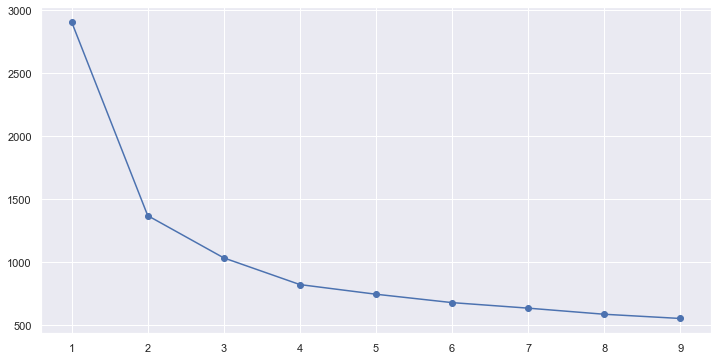

In [1118]:
kmean_clustering()

## ANSWER

### KMean : 

**The elbow plot confirms our visual analysis that there are likely 3 or 4 good clusters**

**Here we have considered both 3 and 4 clusters :**

###################################################################################################
#### FOUR cluster : 

**RESULT :**

**Cluster 0: Here mean mpg is lesser than group 1 and 2, with avg of 6.17 cyl**

**Cluster 1: These are vehicles with highest mean mpg**

**Cluster 2: These are on higher end of mean mpg but lesser than cluster 1**

**Cluster 3: These are vehicles with least mean mpg**

**SCORES ::**

    FOR n= 4 ::
    Inertia (error)= 818.4570329845308
    Silhouette_score = 0.32626749496530005
    
###################################################################################################


#### THREE cluster : 

**RESULT :**
    
**Cluster 0: MEDIUM RANGE MPG CARS (medium mpg, medium wt, medium acceration): Here mean mpg is average or in between c1 and c2**

**Cluster 1: HIGH RANGE MPG CARS (high mpg, less wt, high acceration): These are vehicles with highest mean mpg, lesser weight and high acceleration**

**Cluster 2: SMALL RANGE MPG CARS (lower mpg, high wt, lower acceration): These are vehicles with least mean mpg but mean weight are more.**

**SCORES ::**

    FOR n= 3 ::
    Inertia (error)= 1014.5017454129314
    Silhouette_score = 0.3387598488728533
    
###################################################################################################

**Here we can see that either of 3 or 4 are good to consider, inertia(WSS) is better for n=4 but silhoutte score is lightly better for n=3**

**Both n=3 and n=4 have almost similar silhoutte scores**

### Hierachial clustering

**Cophenet index is a measure of the correlation between the distance of points in feature space and distance on dendrogram.** 

**Closer it is to 1, the better is the clustering** 


**So Lets check Cophenet index for n=4 and n=3 ::**

**Cophenetic score for (n =4) =0.7631**

**Cophenetic score for (n =3) =0.77894**

**Since clusters =3 has better cophenetic coefficient, we can consider n =3 for hierarchial clustering**


###################################################################################################

**RESULTS FOR n=3 clustering :**

**Cluster 1: HIGH RANGE MPG CARS (high mpg, less wt, high acceration): These are vehicles with highest mean mpg, lesser weight and high acceleration**

**Cluster 2: SMALL RANGE MPG CARS (lower mpg, high wt, lower acceration): These are vehicles with least mean mpg but mean weight are more.**

**Cluster 3: MEDIUM RANGE MPG CARS (medium mpg, medium wt, medium acceration): Here mean mpg is average or in between c1 and c2**

**• Use linear regression model on different clusters separately and print the coefficients of the models individually**

In [1119]:
y = car_new['mpg']
x = car_new.drop(['mpg'], axis=1)
x.head(3)

,cyl,disp,hp,wt,acc,age,origin_2,origin_3
0,1.498191,1.090604,0.823608,0.630870,-1.353748,1.627426,0,0
1,1.498191,1.503514,1.523992,0.854333,-1.589535,1.627426,0,0
2,1.498191,1.196232,1.243998,0.550470,-1.835805,1.627426,0,0


In [1120]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=1)

In [1121]:

def linearRegressionModel(x_train,y_train,x_test,y_test,model):
    regression_model = LinearRegression()
    if model=='LR':
        regression_model = LinearRegression()
    elif model=='lasso':
        regression_model = Lasso(alpha=0.1)
    elif model=='ridge':
        regression_model = Ridge(alpha=.3)
    else:
        regression_model = LinearRegression()
    
    regression_model.fit(x_train,y_train)
    print(f"{model} :: ")
    print (f"{model} model:", (regression_model.coef_))
    print("Train accuracy", regression_model.score(x_train, y_train))
    print("Test accuracy", regression_model.score(x_test, y_test))


linearRegressionModel(X_train, y_train, X_test, y_test, 'LR')

print("\n\n")

linearRegressionModel(X_train, y_train, X_test, y_test, 'lasso')

print("\n\n")

linearRegressionModel(X_train, y_train, X_test, y_test, 'ridge')

LR :: 
LR model: [-0.08035158  0.1527018  -0.36583637 -0.51641442 -0.11818455 -0.34181765
  0.23006978  0.17320095]
Train accuracy 0.885111127269854
Test accuracy 0.8915530561721962



lasso :: 
lasso model: [-0.         -0.         -0.16974501 -0.54838154  0.         -0.25161161
  0.          0.        ]
Train accuracy 0.8568484665363305
Test accuracy 0.8797222061844738



ridge :: 
ridge model: [-0.07687941  0.13920723 -0.36653269 -0.50845284 -0.11985127 -0.34063802
  0.22395737  0.16872845]
Train accuracy 0.8851022297292884
Test accuracy 0.891660998648879


#### CUMULATIVE LINEAR REGRESSION RESULTS (WITHOUT CLUSTERING): 

----------------------------------
**LR ::** 


**LR model coefficients :** 
[-0.08035158  0.1527018  -0.36583637 -0.51641442 -0.11818455 -0.34181765 0.23006978  0.17320095]

**Train accuracy** 0.885111127269854

**Test accuracy** 0.8915530561721962



----------------------------------
**Lasso ::**


**lasso model coefficients :**  
[-0.         -0.         -0.16974501 -0.54838154  0.         -0.25161161      0.          0.        ]

**Train accuracy** 0.8568484665363305

**Test accuracy** 0.8797222061844738



----------------------------------
**Ridge ::**


**Ridge model coefficients:**
[-0.07687941  0.13920723 -0.36653269 -0.50845284 -0.11985127 -0.34063802  0.22395737  0.16872845]

**Train accuracy** 0.8851022297292884

**Test accuracy** 0.891660998648879


===============================

**NEXT**
**We need to create create copy of unscaled data, group the clusters and then scale it**

**As grouping of already scaled data will not be normalised in newly grouped set**

In [1250]:
#Getting earlier unscaled actual data copy
df_car_lr= df_car.copy().drop(["GROUP"],axis=1)
df_car_lr['clusters']=  car_hier2['clusters']

df_car_lr.head(5)

,mpg,cyl,disp,hp,wt,acc,age,origin_2,origin_3,clusters
0,2.890372,8,307.0,4.867534,3504,2.484907,12,0,0,2
1,2.708050,8,350.0,5.105945,3693,2.442347,12,0,0,2
2,2.890372,8,318.0,5.010635,3436,2.397895,12,0,0,2
3,2.772589,8,304.0,5.010635,3433,2.484907,12,0,0,2
4,2.833213,8,302.0,4.941642,3449,2.351375,12,0,0,2


In [1251]:
df_car_lr = df_car_lr.astype({"origin_2": np.int64, "origin_3": np.int64, "clusters": np.int64})
df_car_lr.info()
df_car_lr.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   mpg       398 non-null    float64
 1   cyl       398 non-null    int64  
 2   disp      398 non-null    float64
 3   hp        398 non-null    float64
 4   wt        398 non-null    int64  
 5   acc       398 non-null    float64
 6   age       398 non-null    int64  
 7   origin_2  398 non-null    int64  
 8   origin_3  398 non-null    int64  
 9   clusters  398 non-null    int64  
dtypes: float64(4), int64(6)
memory usage: 31.2 KB


mpg         0
cyl         0
disp        0
hp          0
wt          0
acc         0
age         0
origin_2    0
origin_3    0
clusters    0
dtype: int64

In [1252]:
cluster_01 =df_car_lr[df_car_lr['clusters']==1].reset_index(drop=True)
display(cluster_01.head(2))


cluster_02 =df_car_lr[df_car_lr['clusters']==2].reset_index(drop=True)
display(cluster_02.head(2))


cluster_03 =df_car_lr[df_car_lr['clusters']==3].reset_index(drop=True)
display(cluster_03.head(2))


,mpg,cyl,disp,hp,wt,acc,age,origin_2,origin_3,clusters
0,3.178054,4,113.0,4.553877,2372,2.708050,12,0,1,1
1,3.295837,4,97.0,4.477337,2130,2.674149,12,0,1,1


,mpg,cyl,disp,hp,wt,acc,age,origin_2,origin_3,clusters
0,2.890372,8,307.0,4.867534,3504,2.484907,12,0,0,2
1,2.708050,8,350.0,5.105945,3693,2.442347,12,0,0,2


,mpg,cyl,disp,hp,wt,acc,age,origin_2,origin_3,clusters
0,3.091042,6,198.0,4.553877,2833,2.74084,12,0,0,3
1,2.890372,6,199.0,4.574711,2774,2.74084,12,0,0,3


In [1253]:
y_1 = cluster_01['mpg']
x_1 = cluster_01.drop(['mpg','clusters'], axis=1)
display(x_1.head(2))
display(y_1.head(2))


y_2 = cluster_02['mpg']
x_2 = cluster_02.drop(['mpg','clusters'], axis=1)
display(x_2.head(2))
display(y_2.head(2))


y_3 = cluster_03['mpg']
x_3 = cluster_03.drop(['mpg','clusters'], axis=1)
display(x_3.head(2))
display(y_3.head(2))


,cyl,disp,hp,wt,acc,age,origin_2,origin_3
0,4,113.0,4.553877,2372,2.708050,12,0,1
1,4,97.0,4.477337,2130,2.674149,12,0,1


0    3.178054
1    3.295837
Name: mpg, dtype: float64

,cyl,disp,hp,wt,acc,age,origin_2,origin_3
0,8,307.0,4.867534,3504,2.484907,12,0,0
1,8,350.0,5.105945,3693,2.442347,12,0,0


0    2.890372
1    2.708050
Name: mpg, dtype: float64

,cyl,disp,hp,wt,acc,age,origin_2,origin_3
0,6,198.0,4.553877,2833,2.74084,12,0,0
1,6,199.0,4.574711,2774,2.74084,12,0,0


0    3.091042
1    2.890372
Name: mpg, dtype: float64

In [1254]:
x_3.count()

cyl         87
disp        87
hp          87
wt          87
acc         87
age         87
origin_2    87
origin_3    87
dtype: int64

In [1255]:

X_train, X_test, y_train, y_test = train_test_split(x_1, y_1, test_size=0.30, random_state=1)

linearRegressionModel(X_train, y_train, X_test, y_test, 'LR')

print("\n\n")

linearRegressionModel(X_train, y_train, X_test, y_test, 'lasso')

print("\n\n")

linearRegressionModel(X_train, y_train, X_test, y_test, 'ridge')

LR :: 
LR model: [ 0.15402833 -0.0002874  -0.20785986 -0.00023851 -0.11620304 -0.03089136
  0.03727347  0.048704  ]
Train accuracy 0.7282508680491857
Test accuracy 0.7074816701271414



lasso :: 
lasso model: [ 0.         -0.         -0.         -0.00031891  0.         -0.02565403
  0.          0.        ]
Train accuracy 0.651245268434879
Test accuracy 0.6024384553194471



ridge :: 
ridge model: [ 0.14606199 -0.0002358  -0.16735457 -0.0002564  -0.077189   -0.03140845
  0.03940004  0.04754822]
Train accuracy 0.7276666708378962
Test accuracy 0.710526192202036


In [1256]:
X_train, X_test, y_train, y_test = train_test_split(x_2, y_2, test_size=0.30, random_state=1)

linearRegressionModel(X_train, y_train, X_test, y_test, 'LR')

print("\n\n")

linearRegressionModel(X_train, y_train, X_test, y_test, 'lasso')

print("\n\n")

linearRegressionModel(X_train, y_train, X_test, y_test, 'ridge')

LR :: 
LR model: [ 0.00000000e+00  3.33231135e-04 -4.78453000e-01 -8.09296405e-05
 -3.02980716e-01 -2.11290394e-02  0.00000000e+00  0.00000000e+00]
Train accuracy 0.5641104775414016
Test accuracy 0.6816557979452877



lasso :: 
lasso model: [ 0.         -0.00035395 -0.         -0.00014271 -0.         -0.00953995
  0.          0.        ]
Train accuracy 0.4065887874582028
Test accuracy 0.5092012334299763



ridge :: 
ridge model: [ 0.00000000e+00  2.40899509e-04 -2.98656201e-01 -1.09374164e-04
 -1.78817759e-01 -2.23054624e-02  0.00000000e+00  0.00000000e+00]
Train accuracy 0.5500989385648127
Test accuracy 0.6824157994746471


In [1257]:
X_train, X_test, y_train, y_test = train_test_split(x_3, y_3, test_size=0.30, random_state=1)

linearRegressionModel(X_train, y_train, X_test, y_test, 'LR')

print("\n\n")

linearRegressionModel(X_train, y_train, X_test, y_test, 'lasso')

print("\n\n")

linearRegressionModel(X_train, y_train, X_test, y_test, 'ridge')

LR :: 
LR model: [ 1.00502700e-01  5.72022699e-04 -8.15096217e-02 -2.89069072e-04
 -3.53467906e-01 -3.24353455e-02 -2.32474641e-01  1.33916721e-02]
Train accuracy 0.6464215000805462
Test accuracy -0.16753189091398157



lasso :: 
lasso model: [ 0.          0.0003428   0.         -0.00029544 -0.         -0.02472225
 -0.          0.        ]
Train accuracy 0.5328410690115091
Test accuracy 0.15672404418644348



ridge :: 
ridge model: [ 0.08789239  0.00069059  0.01127761 -0.00033511 -0.16804338 -0.03227356
 -0.16639041  0.02776257]
Train accuracy 0.6402169866559589
Test accuracy -0.06264445153741893


**• How using different models for different clusters will be helpful in this case and how it will be different than using one single model without clustering? Mention how it impacts performance and prediction.**

### ANSWER: 
**As we can see that after the clustering we are seeing many of the feature's  coeficients are becoming 0. Which indicates they are no longer contributing much in predicting mpg.**

**After comparing the acurracy of different models, we can see that different models fits on different clusters differently. For example :**
        
        CLUSTER 01 : Ridge is giving the best results.
        CLUSTER 02 : Linear regression and Ridge is giving better results, while Lasso is failing.
        CLUSTER 03 : Lasso is giving better results while Linear regression and Ridge are failing here.

**After clustering fewer attributes contributes more toward predicting the mpg for a given cluster. For example :**

        CLUSTER 01 : hp and acc are contributing more toward determining the result as per coefficients
        CLUSTER 02 : disp, wt, age are contributing more toward determining the result as per coefficients
        CLUSTER 03 : disp, wt, age are contributing more toward determining the result as per coefficients

**Clustering here can helps in reducing the dimensionality here as few features are more important for given cluster than others and it helps in faster execution**

## OBSERVATIONS: 

1. The mpg column for the different brand names are a suspect. Found values much larger than the factory values for those cars! Definition of mpg too may have to be looked at. 

2. The weight of the car too is a suspect as they differed from the specifications for those models. There are different types of weights. Was the data collected consistently

3. The HP column too had values different from the factory specifications. There are different types of HP values. Was the a standard definition followed




## 6. Improvisation: 
• Detailed suggestions or improvements or on quality, quantity, variety, velocity, veracity etc. on the data points collected by the company to perform a better data analysis in future.

In [1163]:
import pandas_profiling 
pandas_profiling.ProfileReport(cardata)

Summarize dataset:   0%|          | 0/24 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Here we chave very less data on each cluster we finaly get, when we are applying the model after clustering, we are left with very few data**

**Data is imbalanced here**

**Many of the features have high correlation between then which is not good.**

**Missing data points**

**For those instances where the declared mpg is greater than factory mpg, replace with factory mpg. Similarly for other columns. When this was done the standard distribution for the mpg column fell by 50%**


====================================================================================================================
# END PART ONE
====================================================================================================================

====================================================================================================================
# PART TWO 
====================================================================================================================

• **DOMAIN:** Manufacturing

• **CONTEXT:** Company X curates and packages wine across various vineyards spread throughout the country.

• **DATA DESCRIPTION:** The data concerns the chemical composition of the wine and its respective quality.

**Attribute Information:**

1. A, B, C, D: specific chemical composition measure of the wine

2. Quality: quality of wine [ Low and High ]
    

• **PROJECT OBJECTIVE:** Goal is to build a synthetic data generation model using the existing data provided by the company.

**Steps and tasks:**

1. Design a synthetic data generation model which can impute values [Attribute: Quality] wherever empty the company has missed recording the data.

## Solutioning Steps: 

- Target variable of the existing dataset has missing values.
- Use the dataset ( ignore the existing target ) to generate clusters ( new potential target )
    - Drop the quality 
    - Use Kmean to cluster the data
    - Find optimal n(number of cluster)
    - fit the model 

- Compare the clusters with the existing target and find if they follow similar pattern.

- If you find a similar pattern replace the newly predicted cluster with original missing targets from dataset

**Read the excel into dataframe**

In [1164]:
df2 = pd.read_excel("Part2 - Company.xlsx")

In [1165]:
df2.head()

,A,B,C,D,Quality
0,47,27,45,108,Quality A
1,174,133,134,166,Quality B
2,159,163,135,131,NaN
3,61,23,3,44,Quality A
4,59,60,9,68,Quality A


**Check shape of dataframe**

In [1166]:
df2.shape

(61, 5)

In [1167]:
df2['Quality'].unique()

array(['Quality A', 'Quality B', nan], dtype=object)

There are 2 type of quality: Quality A and B

**Lets Drop the NaN values as we dont have quality for them for processing purpose**

In [1168]:
df2.isnull().sum()

A           0
B           0
C           0
D           0
Quality    18
dtype: int64

In [1169]:
df2_val = df2.dropna()
df2_val.shape

(43, 5)

**Converting quality data to numerical(0->Quality A, 1->Quality B**

In [1170]:
df2_val.replace("Quality A",0,inplace=True)
df2_val.replace("Quality B",1,inplace=True)

df2_val.head()

,A,B,C,D,Quality
0,47,27,45,108,0
1,174,133,134,166,1
3,61,23,3,44,0
4,59,60,9,68,0
6,34,28,78,22,0


**Extracting the features**

In [1171]:
df2_features = df2_val.drop(["Quality"], axis=1)
df2_features.head()

,A,B,C,D
0,47,27,45,108
1,174,133,134,166
3,61,23,3,44
4,59,60,9,68
6,34,28,78,22


**Scaling Data**

In [1172]:
df2_scaled =df2_features.apply(zscore)
df2_scaled.head()

,A,B,C,D
0,-0.901809,-1.305756,-0.853938,0.182569
1,1.194734,0.486366,0.512291,1.121385
3,-0.670694,-1.373384,-1.498676,-0.853367
4,-0.703710,-0.747831,-1.406570,-0.464891
6,-1.116416,-1.288849,-0.347359,-1.209469


**Clustering with K Mean and find optimal number of clusters with elbow method**

,num_clusters,cluster_errors
0,1,1.942416
1,2,0.864776
2,3,0.783097
3,4,0.722219
4,5,0.665124
5,6,0.613694
6,7,0.572546
7,8,0.544378
8,9,0.514119


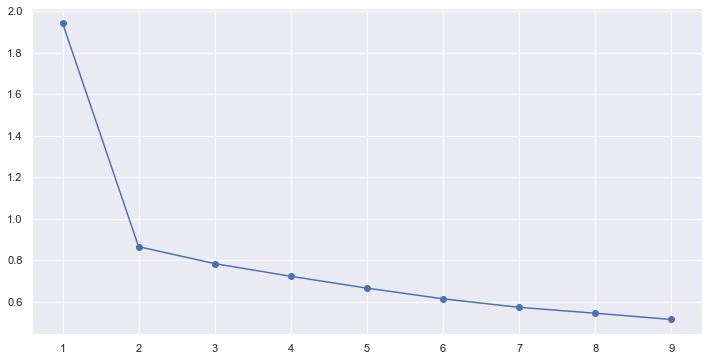

In [1173]:
def kmean_clustering_2(data):
    cluster_range = range(1,10)
    cluster_errors = []
    for num_clusters in cluster_range:
        clusters = KMeans(num_clusters)
        clusters.fit(data)
        labels = clusters.labels_
        cluster_errors.append(sum(np.min(cdist(data, clusters.cluster_centers_, 'euclidean'), axis=1)) / data.shape[0])


    clusters_df = pd.DataFrame({"num_clusters": cluster_range, "cluster_errors": cluster_errors})
    display(clusters_df[0:10])
    plt.figure(figsize=(12,6))
    plt.plot( clusters_df.num_clusters, clusters_df.cluster_errors, marker = "o" )
kmean_clustering_2(df2_scaled)

**Since the most of the unique cluster in data is 2 (Quality A and B) and the elbow is significant at 2 clusters, we can take number of cluster as 2**

In [1174]:
final_model=KMeans(2)
final_model.fit(df2_scaled)
prediction=final_model.predict(df2_scaled)


prediction

array([1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0,
       0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0],
      dtype=int32)

In [1175]:

# As seen with multiple runs we are unable to determine the clustering number, 
# hence we will replace 0 with 1 by checking first row
A = 0
B = 1

if prediction[0] == 1:
    df2_val['Quality']=df2_val['Quality'].replace({0:1, 1:0})
    A = 1
    B = 0

accuracy = accuracy_score(df2_val['Quality'], prediction)
print("Accuracy=", accuracy)

Accuracy= 1.0


**Here we can see that the accuracy is 1. Which is good**

**Lets Predict the values for NaN data**

1. Scaled the initial df2 numerical data
2. predict the values with model
3. Replace back 0: "Quality A" and 1: "Quality B"

In [1176]:
df2_scaled_all= df2.drop(["Quality"], axis=1).apply(zscore)
df2_scaled_all["Quality"]=df2["Quality"]
df2_scaled_all.head()

,A,B,C,D,Quality
0,-1.168034,-1.561080,-1.061569,-0.103138,Quality A
1,0.904992,0.284923,0.306077,0.823013,Quality B
2,0.660147,0.807376,0.321443,0.264129,NaN
3,-0.939512,-1.630740,-1.706975,-1.125099,Quality A
4,-0.972158,-0.986381,-1.614775,-0.741864,Quality A


In [1177]:
df2_scaled_all["Predicted Quality"]=final_model.predict(df2_scaled_all.drop(["Quality"], axis=1))


In [1178]:
df2_scaled_all["Predicted Quality"].replace(A,"Quality A",inplace=True)
df2_scaled_all["Predicted Quality"].replace(B,"Quality B",inplace=True)

In [1179]:
df2_scaled_all

,A,B,C,D,Quality,Predicted Quality
0,-1.168034,-1.561080,-1.061569,-0.103138,Quality A,Quality A
1,0.904992,0.284923,0.306077,0.823013,Quality B,Quality B
2,0.660147,0.807376,0.321443,0.264129,NaN,Quality B
3,-0.939512,-1.630740,-1.706975,-1.125099,Quality A,Quality A
4,-0.972158,-0.986381,-1.614775,-0.741864,Quality A,Quality A
...,...,...,...,...,...,...
56,1.329392,1.207924,1.089784,1.030599,Quality B,Quality B
57,0.301040,1.138264,0.782448,1.349962,NaN,Quality B
58,-0.498789,-1.352098,-1.614775,-0.198947,NaN,Quality A
59,1.002931,0.702886,1.197352,1.333994,NaN,Quality B


**As we can see that the clustering model is very good with predicting the values(Accuracy=1), we can say that the cluster is good for Nan values**

====================================================================================================================
# END PART TWO
====================================================================================================================

====================================================================================================================
# PART THREE 
====================================================================================================================

• **DOMAIN:** Automobile

• **CONTEXT:** The purpose is to classify a given silhouette as one of three types of vehicle, using a set of features extracted from the silhouette. The vehicle may be viewed from one of many different angles.


• **DATA DESCRIPTION:** The data contains features extracted from the silhouette of vehicles in different angles. Four "Corgie" model vehicles were used for the experiment: a double decker bus, Cheverolet van, Saab 9000 and an Opel Manta 400 cars. This particular combination of vehicles was chosen with the expectation that the bus, van and either one of the cars would be readily distinguishable, but it would be more difficult to distinguish between the cars.

    • All the features are numeric i.e. geometric features extracted from the silhouette.
    

• **PROJECT OBJECTIVE:** Apply dimensionality reduction technique – PCA and train a model using principal components instead of training the model using just the raw data.

**Steps and tasks:**

1. Data: Import, clean and pre-process the data
2. EDA and visualisation: Create a detailed performance report using univariate, bi-variate and multivariate EDA techniques. Find out all possible hidden patterns by using all possible methods.
    
    For example: Use your best analytical approach to build this report. Even you can mix match columns to create new columns which can be used for better analysis. Create your own features if required. Be highly experimental and analytical here to find hidden patterns.
3. Classifier: Design and train a best fit SVM classier using all the data attributes.
4. Dimensional reduction: perform dimensional reduction on the data.
5. Classifier: Design and train a best fit SVM classier using dimensionally reduced attributes.
6. Conclusion: Showcase key pointer on how dimensional reduction helped in this case.


### 1. Data: Import, clean and pre-process the data

In [1180]:
df3 = pd.read_csv("Part3 - vehicle.csv")
df3.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [1181]:
df3.shape

(846, 19)

In [1182]:
df3.isnull().sum().sum()

41

**As we can see that out of 846 rows, 41 are null. Hence we will remove the row data with null value**

In [1183]:
df3.dropna(inplace=True)
df3.shape

(813, 19)

**Now we have 813 rows and 19 columns**

In [1184]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 813 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  813 non-null    int64  
 1   circularity                  813 non-null    float64
 2   distance_circularity         813 non-null    float64
 3   radius_ratio                 813 non-null    float64
 4   pr.axis_aspect_ratio         813 non-null    float64
 5   max.length_aspect_ratio      813 non-null    int64  
 6   scatter_ratio                813 non-null    float64
 7   elongatedness                813 non-null    float64
 8   pr.axis_rectangularity       813 non-null    float64
 9   max.length_rectangularity    813 non-null    int64  
 10  scaled_variance              813 non-null    float64
 11  scaled_variance.1            813 non-null    float64
 12  scaled_radius_of_gyration    813 non-null    float64
 13  scaled_radius_of_gyr

**Lets check for if any other unique values like ?, - or other character**

In [1185]:

for column in df3.columns:
    if is_numeric_dtype(df3[column]):
        row =df3[column].unique()
        print(f"{column}: ",row[np.isnan(row).any()])
    else:
        print(f"{column}: ",df3[column].unique())

compactness:  []
circularity:  []
distance_circularity:  []
radius_ratio:  []
pr.axis_aspect_ratio:  []
max.length_aspect_ratio:  []
scatter_ratio:  []
elongatedness:  []
pr.axis_rectangularity:  []
max.length_rectangularity:  []
scaled_variance:  []
scaled_variance.1:  []
scaled_radius_of_gyration:  []
scaled_radius_of_gyration.1:  []
skewness_about:  []
skewness_about.1:  []
skewness_about.2:  []
hollows_ratio:  []
class:  ['van' 'car' 'bus']


### 2. EDA and visualisation

In [1186]:
numerical_columns = df3.drop(["class"], axis=1).columns
def graphs_analysis(dataset, rows, cols, plot_type, var):
    
    assert plot_type in ['violin', "box", "point", "bar"],"We dont have such as plot type:{}".format(plot_type)
    column_names=numerical_columns
    
    number_of_column=len(column_names)
    fig, axarr=plt.subplots(rows,cols, figsize=(22,22))
    
    counter=0
    for i in range(rows):
        for j in range(cols):
            if 'violin' in plot_type:
                sns.violinplot(x=var, y=column_names[counter],data=dataset, ax=axarr[i][j])
            elif 'box'in plot_type :
                sns.boxplot(x=var, y=column_names[counter],data=dataset, ax=axarr[i][j])
            elif 'point' in plot_type:
                sns.pointplot(x=var,y=column_names[counter],data=dataset, ax=axarr[i][j])
            elif 'bar' in plot_type:
                sns.barplot(x=var,y=column_names[counter],data=dataset, ax=axarr[i][j])
                
            counter+=1
            if counter==(number_of_column-1,):
                break

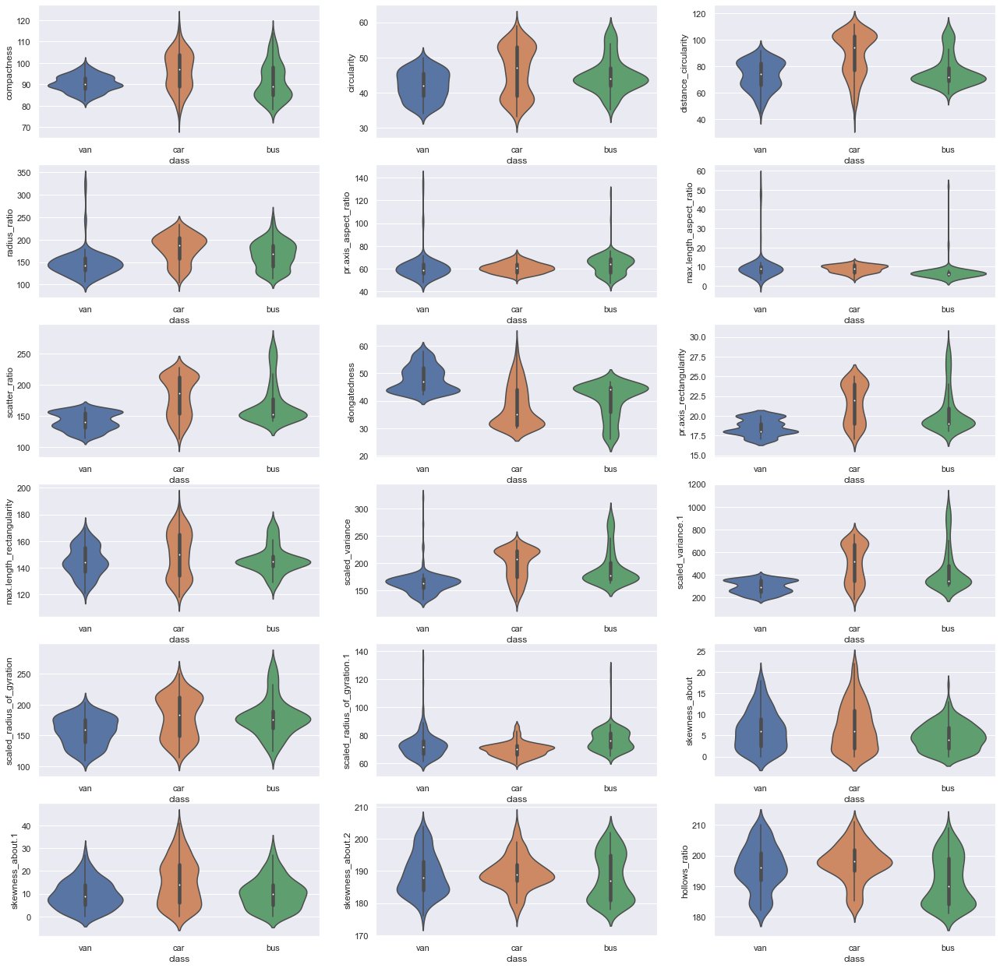

In [1187]:
graphs_analysis(dataset=df3, rows=6, cols=3,plot_type="violin",var="class")

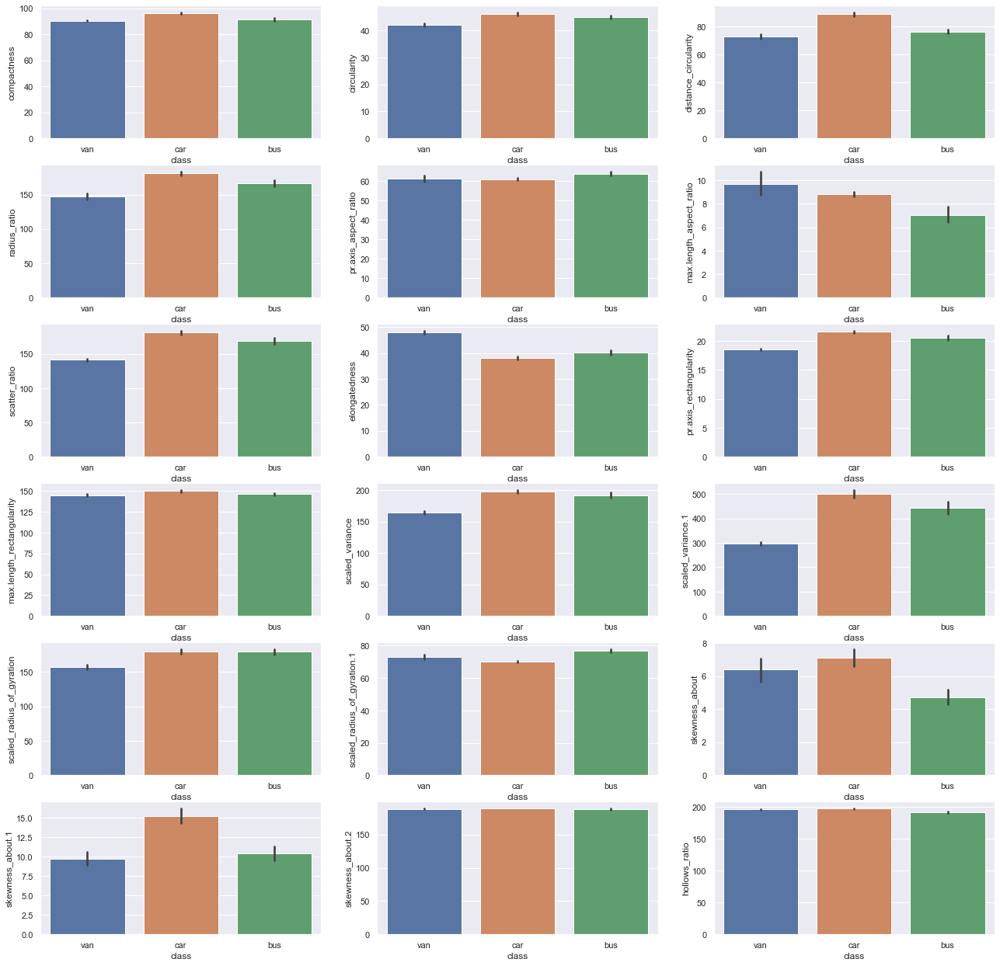

In [1188]:
graphs_analysis(dataset=df3, rows=6, cols=3,plot_type="bar",var="class")

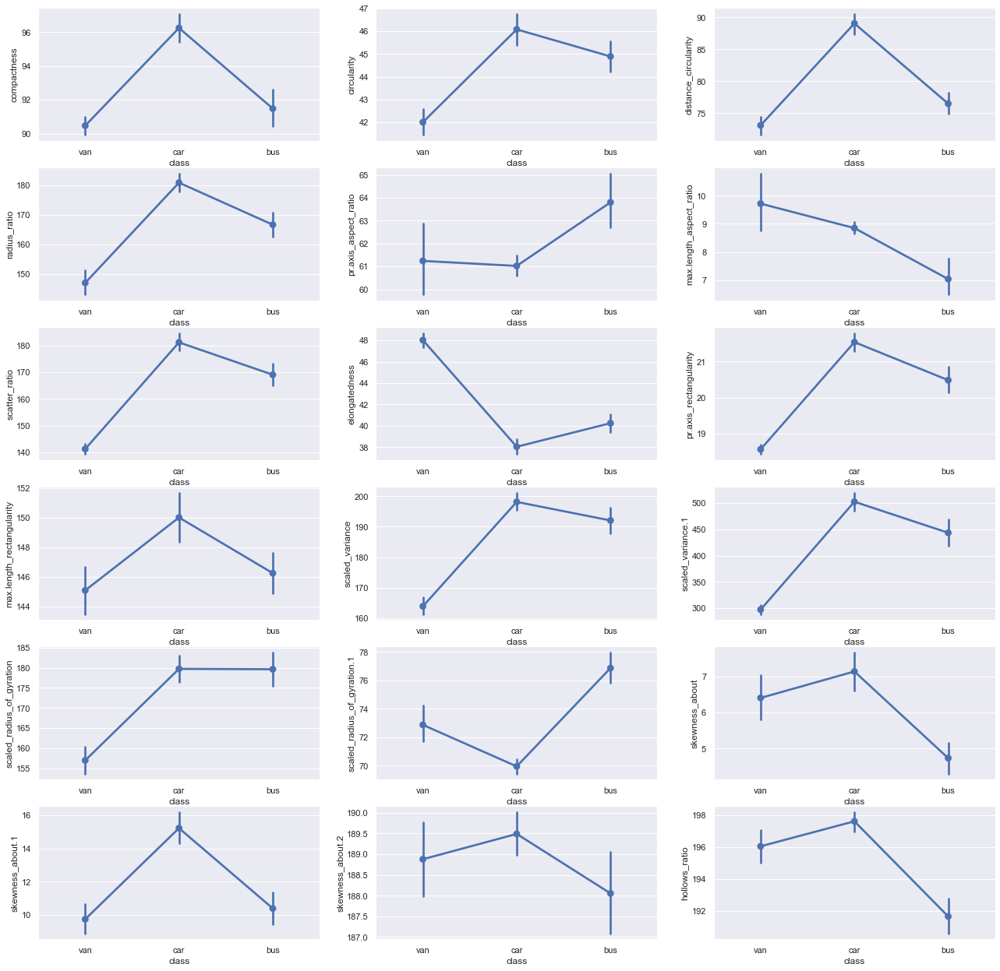

In [1189]:
graphs_analysis(dataset=df3, rows=6, cols=3,plot_type="point",var="class")

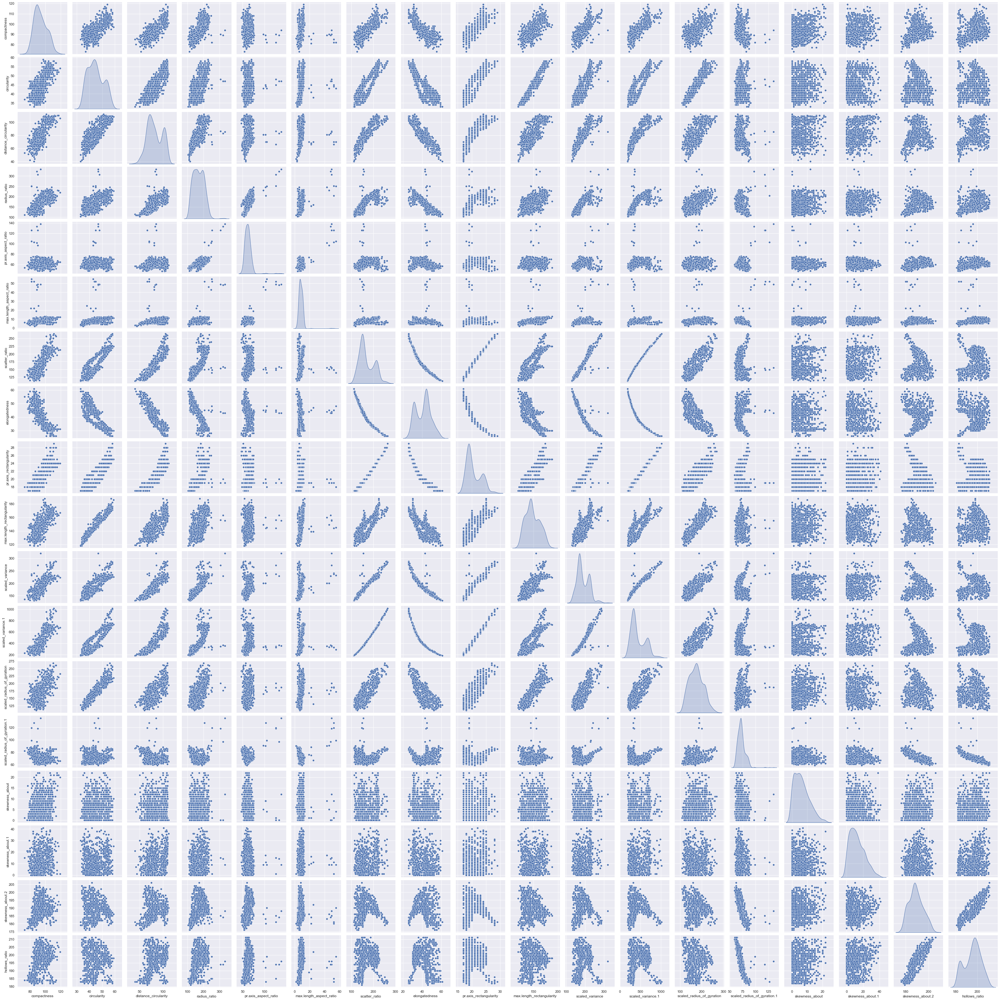

In [1190]:
sns.pairplot(df3,diag_kind='kde')

<AxesSubplot:>

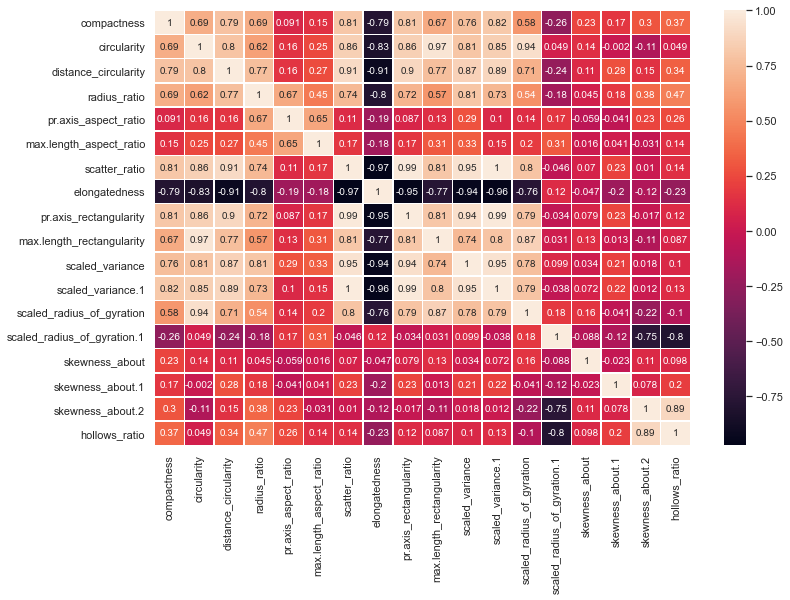

In [1191]:
corr=df3.corr()
fig, ax=plt.subplots(1,1,figsize=(12,8))
sns.heatmap(corr,annot=True, linewidth=.5, ax=ax)

In [1192]:
columns =corr.columns
print("=======================================================")

print("VERY HIGH CORRELATED DATA (|COEF|>=0.9): ")
print("=======================================================")
done=[]
for column in columns:
    for column2 in columns:
        if column!=column2 and column2 not in done:
            if corr[column][column2]>=0.9 or corr[column][column2]<= -0.9:
                print(f"[VERY HIGH CORRELATION] {column} and {column2} : {corr[column][column2]}")
    done.append(column)

print("=======================================================")
print("VERY HIGH CORRELATED DATA (|COEF|>0.8 and <0.9): ")

print("=======================================================")
done=[]

for column in columns:
    for column2 in columns:
        if column!=column2 and column2 not in done:
            if ((corr[column][column2]<0.9 and corr[column][column2]>0.8) 
                or (corr[column][column2]> -0.9 and corr[column][column2]<-0.8)):
                print(f"[HIGH CORRELATION]{column} and {column2} have high correlation of : {corr[column][column2]}")
    done.append(column)
                

VERY HIGH CORRELATED DATA (|COEF|>=0.9): 
[VERY HIGH CORRELATION] circularity and max.length_rectangularity : 0.9653661331735911
[VERY HIGH CORRELATION] circularity and scaled_radius_of_gyration : 0.9355944789550854
[VERY HIGH CORRELATION] distance_circularity and scatter_ratio : 0.9090229285823326
[VERY HIGH CORRELATION] distance_circularity and elongatedness : -0.9127125700082197
[VERY HIGH CORRELATION] scatter_ratio and elongatedness : -0.9734129063102461
[VERY HIGH CORRELATION] scatter_ratio and pr.axis_rectangularity : 0.9919923537102912
[VERY HIGH CORRELATION] scatter_ratio and scaled_variance : 0.9500674717028122
[VERY HIGH CORRELATION] scatter_ratio and scaled_variance.1 : 0.9963955460521805
[VERY HIGH CORRELATION] elongatedness and pr.axis_rectangularity : -0.9503450060022666
[VERY HIGH CORRELATION] elongatedness and scaled_variance : -0.93784562688646
[VERY HIGH CORRELATION] elongatedness and scaled_variance.1 : -0.9568575636416149
[VERY HIGH CORRELATION] pr.axis_rectangulari

**Observations: As we can see that there are large number of pair of data with high correlations.**

### 3. Classifier: Design and train a best fit SVM classier using all the data attributes.


**• Segregate predictors vs target attributes**

    1. x: features
    2. y: target variables 

In [1193]:
x,y = df3.loc[:,df3.columns != 'class'], df3.loc[:,'class']

In [1194]:
x.head(3)

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196


In [1195]:
y.head(3)

0    van
1    van
2    car
Name: class, dtype: object

In [1196]:
XScaled  = x.apply(zscore)  

XScaled.describe()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
count,8.130000e+02,8.130000e+02,8.130000e+02,8.130000e+02,8.130000e+02,8.130000e+02,8.130000e+02,8.130000e+02,8.130000e+02,8.130000e+02,8.130000e+02,8.130000e+02,8.130000e+02,8.130000e+02,8.130000e+02,8.130000e+02,8.130000e+02,8.130000e+02
mean,-2.425284e-16,-4.642999e-16,-2.351542e-16,3.665238e-16,-2.047016e-16,-1.349201e-16,3.714399e-16,-2.062038e-16,-2.651972e-16,-7.398756e-16,-3.031605e-17,-3.550529e-17,3.348422e-16,1.312159e-16,-1.693329e-17,9.845889e-17,-1.169490e-15,3.482249e-16
std,1.000616e+00,1.000616e+00,1.000616e+00,1.000616e+00,1.000616e+00,1.000616e+00,1.000616e+00,1.000616e+00,1.000616e+00,1.000616e+00,1.000616e+00,1.000616e+00,1.000616e+00,1.000616e+00,1.000616e+00,1.000616e+00,1.000616e+00,1.000616e+00
min,-2.510344e+00,-1.921444e+00,-2.665447e+00,-1.937757e+00,-1.854258e+00,-1.411767e+00,-1.710835e+00,-1.922008e+00,-1.383740e+00,-2.062109e+00,-1.874279e+00,-1.452266e+00,-2.019423e+00,-1.793474e+00,-1.291420e+00,-1.422141e+00,-2.110457e+00,-1.992013e+00
25%,-8.089782e-01,-7.819133e-01,-7.635057e-01,-8.363933e-01,-5.992534e-01,-3.420870e-01,-6.824590e-01,-1.024408e+00,-6.060138e-01,-7.513773e-01,-6.863524e-01,-6.872619e-01,-7.815035e-01,-7.227236e-01,-8.847879e-01,-7.496057e-01,-8.096219e-01,-6.396066e-01
50%,-7.982157e-02,-1.307527e-01,-1.929234e-01,-6.246222e-02,-9.725132e-02,-1.281510e-01,-3.497491e-01,2.578765e-01,-2.171510e-01,-1.305046e-01,-3.010789e-01,-4.246486e-01,-3.875161e-02,-1.873484e-01,-7.152328e-02,-1.891593e-01,3.400092e-03,1.718371e-01
75%,7.708611e-01,6.831980e-01,1.011639e+00,7.710020e-01,4.047507e-01,2.997208e-01,8.903515e-01,6.425619e-01,9.494376e-01,7.663115e-01,9.189540e-01,8.427456e-01,7.349483e-01,3.480268e-01,5.384252e-01,7.075550e-01,6.538177e-01,7.127995e-01
max,3.079857e+00,2.311100e+00,1.899212e+00,4.878790e+00,9.566288e+00,9.926837e+00,2.916857e+00,2.565989e+00,3.282615e+00,2.766901e+00,4.225885e+00,3.309026e+00,2.901308e+00,8.378655e+00,3.181535e+00,3.173519e+00,2.767675e+00,2.065206e+00


In [1197]:
col=list(df3.select_dtypes(include=['int64','float64']).columns)

for c in col:
    #getting upper lower quartile values
    q25,q75=np.percentile(df3[c],25),np.percentile(df3[c],75)
    IQR=q75-q25
    Threshold=IQR*1.5
    lower,upper=q25-Threshold,q75+Threshold
    Outliers=[i for i in df3[c] if i < lower or i > upper]
    print('{} Total Number of outliers in {} : {}'.format('\033[1m',c,len(Outliers)))

 Total Number of outliers in compactness : 0
 Total Number of outliers in circularity : 0
 Total Number of outliers in distance_circularity : 0
 Total Number of outliers in radius_ratio : 3
 Total Number of outliers in pr.axis_aspect_ratio : 8
 Total Number of outliers in max.length_aspect_ratio : 13
 Total Number of outliers in scatter_ratio : 0
 Total Number of outliers in elongatedness : 0
 Total Number of outliers in pr.axis_rectangularity : 0
 Total Number of outliers in max.length_rectangularity : 0
 Total Number of outliers in scaled_variance : 1
 Total Number of outliers in scaled_variance.1 : 2
 Total Number of outliers in scaled_radius_of_gyration : 0
 Total Number of outliers in scaled_radius_of_gyration.1 : 15
 Total Number of outliers in skewness_about : 12
 Total Number of outliers in skewness_about.1 : 3
 Total Number of outliers in skewness_about.2 : 0
 Total Number of outliers in hollows_ratio : 0


In [1198]:
col=list(df3.select_dtypes(include=['int64','float64']).columns)
for c in col:
    #getting upper lower quartile values
    q25,q75=np.percentile(df3[c],25),np.percentile(df3[c],75)
    IQR=q75-q25
    Threshold=IQR*1.5
    lower,upper=q25-Threshold,q75+Threshold
    Outliers=[i for i in df3[c] if i < lower or i > upper]
    print('{} Total Number of outliers in {} Before Imputing : {}'.format('\033[1m',c,len(Outliers)))
    print('\n')
    #taking mean of a column without considering outliers
    df_include = df3.loc[(df3[c] >= lower) & (df3[c] <= upper)]
    mean=int(df_include[c].mean())
    print('{} Mean of {} is {}'.format('\033[1m',c,mean))
    print('\n')
    #imputing outliers with mean
    df3[c]=np.where(df3[c]>upper,mean,df3[c])
    df3[c]=np.where(df3[c]<lower,mean,df3[c])
    Outliers=[i for i in df3[c] if i < lower or i > upper]
    print('{} Total Number of outliers in {} After Imputing : {}'.format('\033[1m',c,len(Outliers)))  
    print('\n')

 Total Number of outliers in compactness Before Imputing : 0


 Mean of compactness is 93


 Total Number of outliers in compactness After Imputing : 0


 Total Number of outliers in circularity Before Imputing : 0


 Mean of circularity is 44


 Total Number of outliers in circularity After Imputing : 0


 Total Number of outliers in distance_circularity Before Imputing : 0


 Mean of distance_circularity is 82


 Total Number of outliers in distance_circularity After Imputing : 0


 Total Number of outliers in radius_ratio Before Imputing : 3


 Mean of radius_ratio is 168


 Total Number of outliers in radius_ratio After Imputing : 0


 Total Number of outliers in pr.axis_aspect_ratio Before Imputing : 8


 Mean of pr.axis_aspect_ratio is 61


 Total Number of outliers in pr.axis_aspect_ratio After Imputing : 0


 Total Number of outliers in max.length_aspect_ratio Before Imputing : 13


 Mean of max.length_aspect_ratio is 8


 Total Number of outliers in max.length_aspect_ratio Aft

In [1199]:
col=list(df3.select_dtypes(include=['int64','float64']).columns)

for c in col:
    #getting upper lower quartile values
    q25,q75=np.percentile(df3[c],25),np.percentile(df3[c],75)
    IQR=q75-q25
    Threshold=IQR*1.5
    lower,upper=q25-Threshold,q75+Threshold
    Outliers=[i for i in df3[c] if i < lower or i > upper]
    print('{} Total Number of outliers in {} : {}'.format('\033[1m',c,len(Outliers)))

 Total Number of outliers in compactness : 0
 Total Number of outliers in circularity : 0
 Total Number of outliers in distance_circularity : 0
 Total Number of outliers in radius_ratio : 0
 Total Number of outliers in pr.axis_aspect_ratio : 0
 Total Number of outliers in max.length_aspect_ratio : 0
 Total Number of outliers in scatter_ratio : 0
 Total Number of outliers in elongatedness : 0
 Total Number of outliers in pr.axis_rectangularity : 0
 Total Number of outliers in max.length_rectangularity : 0
 Total Number of outliers in scaled_variance : 0
 Total Number of outliers in scaled_variance.1 : 0
 Total Number of outliers in scaled_radius_of_gyration : 0
 Total Number of outliers in scaled_radius_of_gyration.1 : 0
 Total Number of outliers in skewness_about : 0
 Total Number of outliers in skewness_about.1 : 0
 Total Number of outliers in skewness_about.2 : 0
 Total Number of outliers in hollows_ratio : 0


In [1200]:
df3.groupby("class").count()


,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
class,,,,,,,,,,,,,,,,,,
bus,205,205,205,205,205,205,205,205,205,205,205,205,205,205,205,205,205,205
car,413,413,413,413,413,413,413,413,413,413,413,413,413,413,413,413,413,413
van,195,195,195,195,195,195,195,195,195,195,195,195,195,195,195,195,195,195


In [1201]:
x,y = df3.loc[:,df3.columns != 'class'], df3.loc[:,'class']
XScaled  = x.apply(zscore)
smote_nc=SMOTE(random_state=42) #specifying categorical column numbers
x_s,y_s=smote_nc.fit_resample(XScaled,y)

In [1202]:
print('Before sampling:')
print(y.value_counts())

Before sampling:
car    413
bus    205
van    195
Name: class, dtype: int64


In [1203]:
print('Before sampling:')
print(y_s.value_counts())

Before sampling:
bus    413
car    413
van    413
Name: class, dtype: int64


In [1204]:
x_train, x_test, y_train, y_test = train_test_split(XScaled, y, test_size=0.30, random_state=1)
x_train_res, x_test_res, y_train_res, y_test_res = train_test_split(x_s, y_s, test_size=0.30, random_state=1)

In [1205]:
print("x_train: \n")
print(x_train.count()[0])
print("x_train_res: \n")
print(x_train_res.count()[0])
print("x_test: \n")
print(x_test.count()[0])
print("x_test_res: \n")
print(x_test_res.count()[0])

x_train: 

569
x_train_res: 

867
x_test: 

244
x_test_res: 

372


Prediction: ['bus' 'bus' 'car' 'car' 'van' 'car' 'car' 'car' 'car' 'car' 'car' 'van'
 'van' 'van' 'van' 'car' 'car' 'car' 'van' 'car' 'van' 'car' 'bus' 'car'
 'car' 'van' 'van' 'car' 'car' 'bus' 'van' 'bus' 'car' 'bus' 'van' 'car'
 'bus' 'bus' 'van' 'car' 'car' 'car' 'car' 'bus' 'bus' 'bus' 'car' 'car'
 'van' 'van' 'bus' 'car' 'car' 'bus' 'car' 'bus' 'car' 'car' 'car' 'car'
 'car' 'car' 'car' 'car' 'van' 'car' 'car' 'car' 'bus' 'van' 'car' 'car'
 'car' 'car' 'car' 'van' 'car' 'bus' 'bus' 'car' 'car' 'bus' 'bus' 'bus'
 'bus' 'car' 'van' 'car' 'car' 'bus' 'car' 'bus' 'bus' 'car' 'van' 'car'
 'car' 'car' 'van' 'car' 'car' 'bus' 'car' 'car' 'car' 'car' 'car' 'car'
 'bus' 'bus' 'car' 'bus' 'car' 'van' 'car' 'car' 'van' 'car' 'bus' 'car'
 'car' 'car' 'car' 'bus' 'bus' 'car' 'car' 'car' 'van' 'van' 'car' 'van'
 'bus' 'car' 'car' 'car' 'car' 'van' 'car' 'bus' 'bus' 'van' 'car' 'car'
 'car' 'car' 'van' 'car' 'car' 'van' 'car' 'van' 'car' 'van' 'bus' 'car'
 'car' 'car' 'bus' 'car' 'car' 'van' 'c

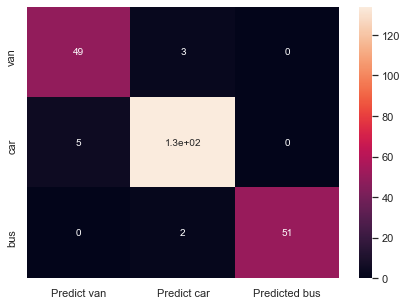

In [1206]:


def svm_analysis(x_train,y_train,x_test,y_test):
    clf = svm.SVC(gamma=0.025, C=3)    
    ############################################################################################
    # Design and train a Naive Bayes Classifier
    ############################################################################################

    clf.fit(x_train, y_train)
    prediction = clf.predict(x_test)
    print('Prediction: {}'.format(prediction))

    ############################################################################################
    # Display the classification accuracies for train and test data.
    ############################################################################################

    print('With SVM accuracy of train data is: ',clf.score(x_train,y_train)) # accuracy
    print('With SVM accuracy of test data is: ',clf.score(x_test,y_test)) # accuracy


    ############################################################################################
    #Display and explain the classification report in detail.
    ############################################################################################

    # Confusion Matrix
    from sklearn import metrics

    predicted_labels = clf.predict(x_test)
    print("Confusion Matrix")
    cm=metrics.confusion_matrix(y_test, predicted_labels, labels=["van", "car", "bus"])

    df_cm = pd.DataFrame(cm, index = [i for i in ["van", "car", "bus"]],
                      columns = [i for i in ["Predict van", "Predict car", "Predicted bus"]])
    plt.figure(figsize = (7,5))
    sns.heatmap(df_cm, annot=True)


    # Classification Report
    print('\n{}'.format(classification_report(y_test, prediction)))
    
svm_analysis(x_train,y_train,x_test,y_test)


Prediction: ['car' 'car' 'bus' 'bus' 'car' 'bus' 'car' 'van' 'van' 'van' 'bus' 'car'
 'van' 'bus' 'car' 'bus' 'bus' 'van' 'car' 'bus' 'van' 'car' 'bus' 'van'
 'bus' 'car' 'bus' 'van' 'bus' 'car' 'bus' 'van' 'van' 'van' 'car' 'van'
 'car' 'bus' 'bus' 'bus' 'car' 'car' 'bus' 'van' 'bus' 'van' 'car' 'van'
 'bus' 'car' 'van' 'van' 'van' 'car' 'van' 'van' 'van' 'van' 'car' 'van'
 'bus' 'bus' 'bus' 'bus' 'van' 'bus' 'van' 'car' 'car' 'bus' 'van' 'bus'
 'bus' 'bus' 'van' 'car' 'car' 'car' 'car' 'van' 'car' 'car' 'van' 'van'
 'car' 'van' 'bus' 'car' 'bus' 'car' 'bus' 'van' 'car' 'car' 'van' 'bus'
 'van' 'bus' 'van' 'bus' 'car' 'van' 'van' 'van' 'bus' 'van' 'van' 'van'
 'car' 'van' 'car' 'car' 'bus' 'van' 'van' 'car' 'car' 'bus' 'car' 'van'
 'van' 'bus' 'bus' 'bus' 'van' 'van' 'van' 'bus' 'car' 'bus' 'van' 'van'
 'car' 'bus' 'bus' 'car' 'van' 'bus' 'bus' 'car' 'van' 'van' 'van' 'car'
 'bus' 'van' 'van' 'car' 'bus' 'bus' 'car' 'van' 'van' 'bus' 'van' 'car'
 'car' 'car' 'van' 'van' 'van' 'car' 'v

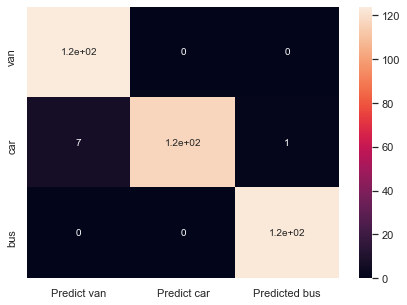

In [1207]:
svm_analysis(x_train_res,y_train_res,x_test_res,y_test_res)


### 4. Dimensional reduction: perform dimensional reduction on the data.


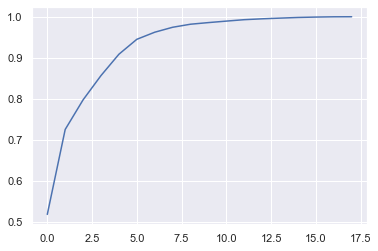

In [1208]:
pca = PCA().fit(x_train_res)

plt.plot(np.cumsum(pca.explained_variance_ratio_))

In [1209]:
#Based on the plot, we will select 7 components
pca = PCA(n_components=7)
pca.fit(x_train_res)

#Assign the components to the X variable
x_transformed = pca.transform(x_s)
x_train_res_pca, x_test_res_pca, y_train_res_pca, y_test_res_pca = train_test_split(x_transformed, y_s, test_size=0.30, random_state=1)




In [1210]:
x_transformed.shape

(1239, 7)

### 5. Classifier: Design and train a best fit SVM classier using dimensionally reduced attributes.


Prediction: ['van' 'car' 'bus' 'bus' 'car' 'bus' 'car' 'van' 'van' 'van' 'bus' 'car'
 'van' 'bus' 'car' 'bus' 'bus' 'van' 'car' 'bus' 'van' 'car' 'bus' 'van'
 'bus' 'car' 'bus' 'van' 'bus' 'car' 'bus' 'van' 'van' 'van' 'van' 'van'
 'car' 'bus' 'bus' 'bus' 'car' 'car' 'bus' 'van' 'bus' 'van' 'car' 'van'
 'bus' 'car' 'van' 'van' 'van' 'car' 'van' 'van' 'van' 'van' 'car' 'van'
 'bus' 'bus' 'bus' 'bus' 'van' 'bus' 'van' 'car' 'car' 'bus' 'van' 'bus'
 'bus' 'bus' 'van' 'car' 'car' 'car' 'car' 'car' 'van' 'car' 'van' 'van'
 'car' 'van' 'bus' 'car' 'bus' 'car' 'bus' 'van' 'car' 'car' 'van' 'bus'
 'van' 'bus' 'van' 'bus' 'bus' 'van' 'van' 'van' 'bus' 'van' 'van' 'van'
 'car' 'van' 'car' 'car' 'bus' 'van' 'van' 'car' 'car' 'bus' 'car' 'van'
 'van' 'bus' 'bus' 'bus' 'van' 'van' 'van' 'bus' 'car' 'bus' 'van' 'van'
 'car' 'bus' 'bus' 'van' 'van' 'bus' 'bus' 'car' 'van' 'van' 'van' 'car'
 'bus' 'car' 'van' 'car' 'bus' 'bus' 'car' 'van' 'van' 'bus' 'van' 'car'
 'car' 'car' 'van' 'van' 'van' 'car' 'v

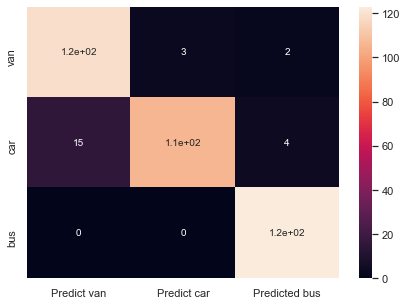

In [1211]:

svm_analysis(x_train_res_pca,y_train_res_pca,x_test_res_pca,y_test_res_pca)


### 6. Conclusion: Showcase key pointer on how dimensional reduction helped in this case.



| model | Train accuracy | Test accuracy | dimension |
| --- | --- | --- | --- |
| SVM | 98.39 | 97.85 | 18 |
| SVM with PCA transform | 95 | 93.55 | 7 |


**We can see that even after reducing the dimentionality from 18 to 7, we are getting 93.55% accuracy with test data and 95% accuracy in training data.**

**This is minor change in acurracy but dimension is getting reduced by 11**

====================================================================================================================
# END PART THREE
====================================================================================================================

====================================================================================================================
# PART FOUR 
====================================================================================================================

• **DOMAIN:** Sports management

• **CONTEXT:** Company X is a sports management company for international cricket.


• **DATA DESCRIPTION:** The data is collected belongs to batsman from IPL series conducted so far. Attribute Information:
1. Runs: Runs score by the batsman
2. Ave: Average runs scored by the batsman per match
3. SR: strike rate of the batsman
4. Fours: number of boundary/four scored
5. Six: number of boundary/six scored
6. HF: number of half centuries scored so far

• **PROJECT OBJECTIVE:** Goal is to build a data driven batsman ranking model for the sports management company to make business decisions.

**Steps and tasks:**

1. EDA and visualisation: Create a detailed performance report using univariate, bi-variate and multivariate EDA techniques. Find out all possible hidden patterns by using all possible methods.
2. Build a data driven model to rank all the players in the dataset using all or the most important performance features.


## SOLUTIONING :

- Sports dataset is provided, use the same to implement PCA.
- Obtain eigen values and eigen vectors from the above.
- Perform a mathematical operation between eigen value, eigen vectors and the original dataset to arrive to a single digit score.
    - example: 
                - Say we chose 2 PCs
                - Score for PC1= Eigen vector * Eigen values
                - Similarly calculate score for all chose PCs
                - Add all the score up to get a final score
- Descending sort the players as per their above calculated scores.

In [1212]:
df4 = pd.read_csv("Part4 - batting_bowling_ipl_bat.csv")
df4.head()

,Name,Runs,Ave,SR,Fours,Sixes,HF
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [1213]:
df4.shape

(180, 7)

In [1214]:
df4.isnull().sum().sum()

630

In [1215]:
df4[df4['Name'].isnull()]

,Name,Runs,Ave,SR,Fours,Sixes,HF
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
170,NaN,NaN,NaN,NaN,NaN,NaN,NaN
172,NaN,NaN,NaN,NaN,NaN,NaN,NaN
174,NaN,NaN,NaN,NaN,NaN,NaN,NaN
176,NaN,NaN,NaN,NaN,NaN,NaN,NaN


**AS we can see that the all the row with null values have each and every columns as NaN, hence we can remove the row as doesnot contains any data**

In [1216]:
df4.dropna(inplace=True)
df4.head(3)

,Name,Runs,Ave,SR,Fours,Sixes,HF
1,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0
3,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0
5,V Sehwag,495.0,33.00,161.23,57.0,19.0,5.0


In [1217]:
df4.shape

(90, 7)

In [1218]:
df4.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 90 entries, 1 to 179
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Name    90 non-null     object 
 1   Runs    90 non-null     float64
 2   Ave     90 non-null     float64
 3   SR      90 non-null     float64
 4   Fours   90 non-null     float64
 5   Sixes   90 non-null     float64
 6   HF      90 non-null     float64
dtypes: float64(6), object(1)
memory usage: 5.6+ KB


### 1. EDA and visualisation 

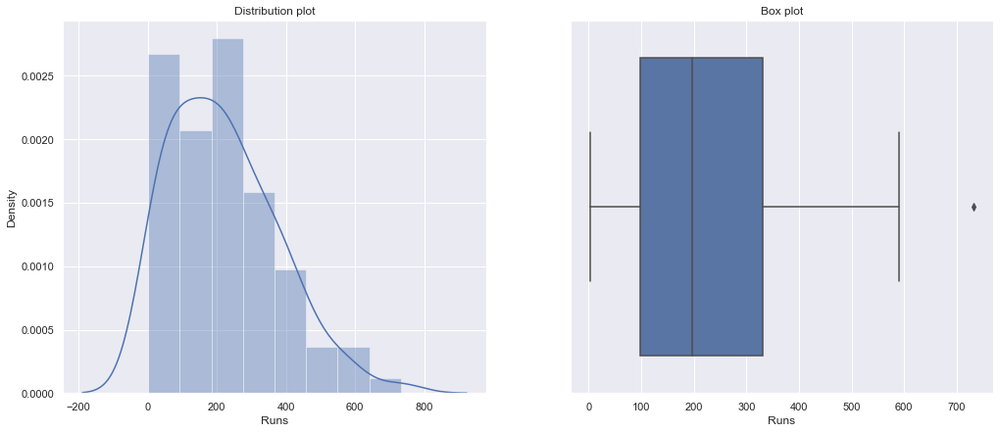

Total Number of outliers in Runs: 1


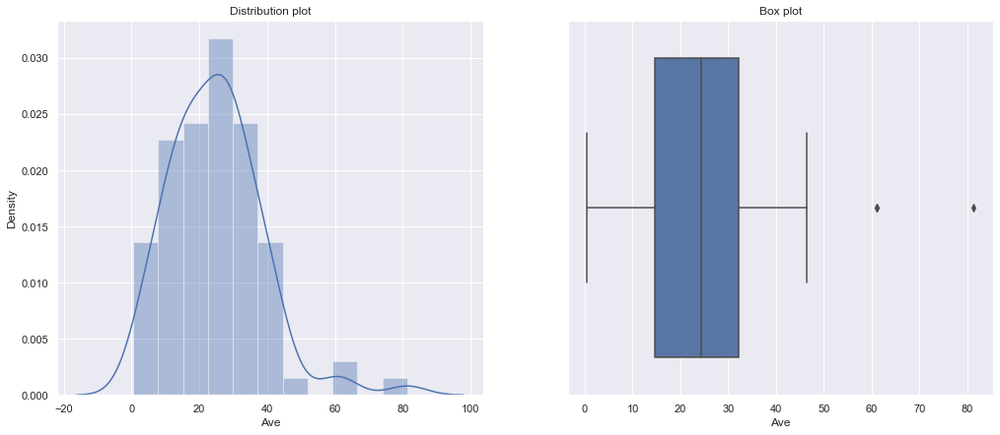

Total Number of outliers in Ave: 3


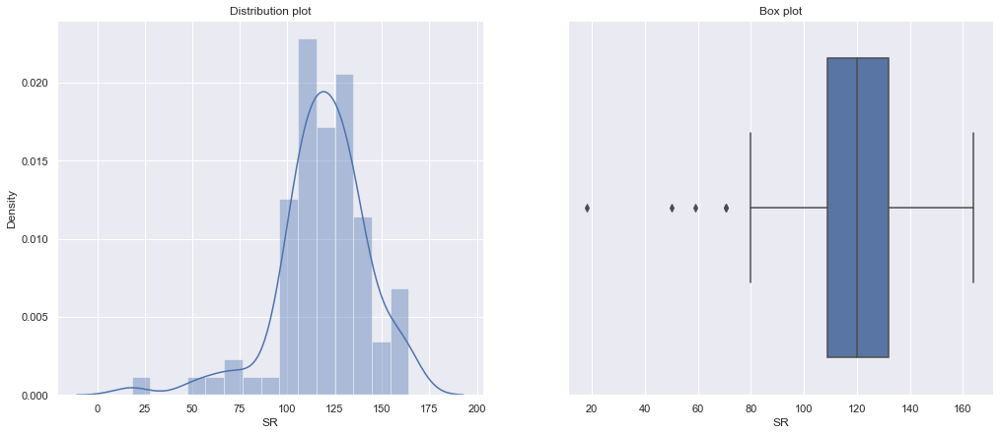

Total Number of outliers in SR: 5


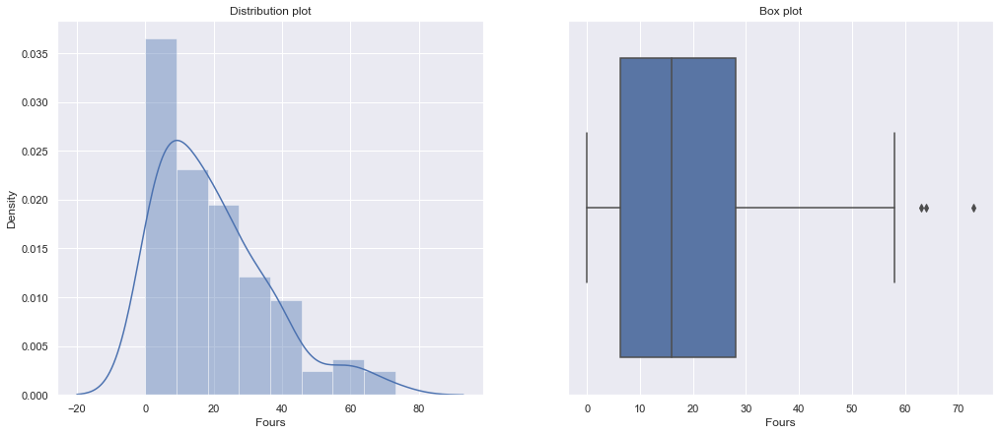

Total Number of outliers in Fours: 3


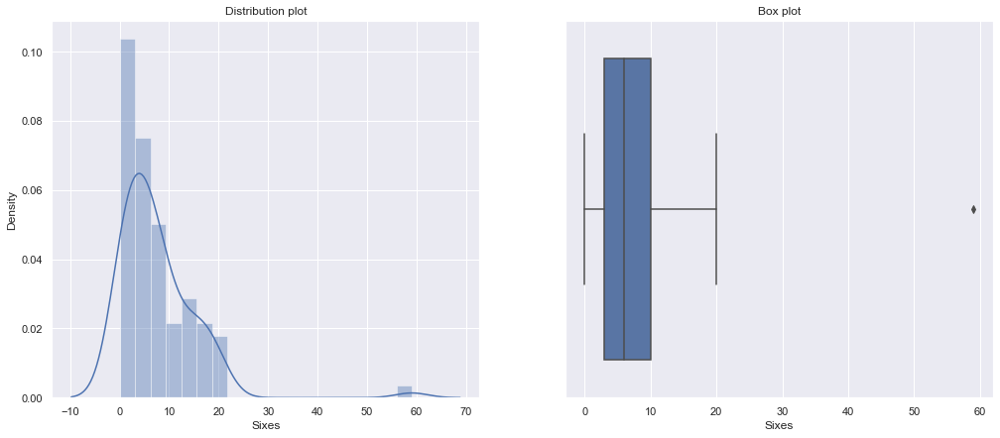

Total Number of outliers in Sixes: 1


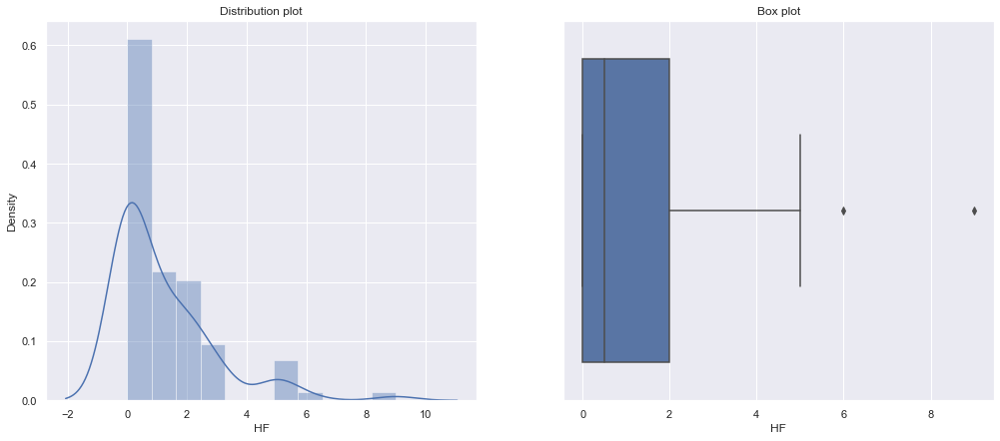

Total Number of outliers in HF: 2


In [1219]:
def univariate_analysis_boxplot_distplot(dataset, criteria):
    f, axes = plt.subplots(1, 2, figsize=(17,7))
    sns.boxplot(x = criteria, data=dataset,  orient='h' , ax=axes[1])
    sns.distplot(dataset[criteria],  ax=axes[0])
    axes[0].set_title('Distribution plot')
    axes[1].set_title('Box plot')
    plt.show()
    #checking count of outliers.
    q25,q75=np.percentile(dataset[criteria],25),np.percentile(dataset[criteria],75)
    IQR=q75-q25
    Threshold=IQR*1.5
    lower,upper=q25-Threshold,q75+Threshold
    Outliers=[i for i in dataset[criteria] if i < lower or i > upper]
    
    print(f'Total Number of outliers in {criteria}: {len(Outliers)}')       
    
col_list=list(df4.select_dtypes(include=['int64','float64']).columns)

for column in col_list:
    univariate_analysis_boxplot_distplot(df4, column)

**Runs : The runs distribution is slighly skewed toward right**

**AVG  : The AVG distribution has few outliers**

**SR : The SR distribution has few outlier and is skewed toward left**

**Four : The Four distribution is slighly skewed toward right**

**Sixes : The runs distribution is slighly skewed toward right with few outliers**

**HF : The HF distribution is slighly skewed toward right with few outliers**

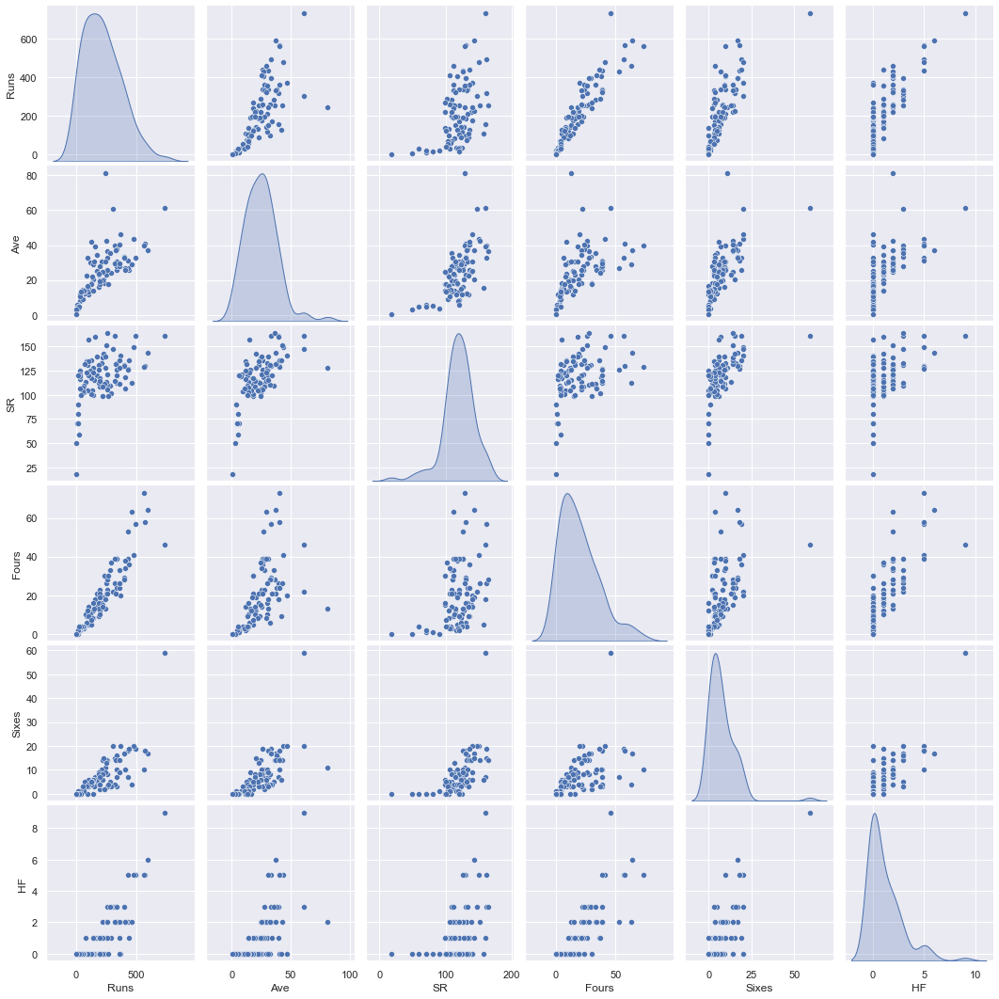

In [1220]:
sns.pairplot(df4,diag_kind='kde')

<AxesSubplot:>

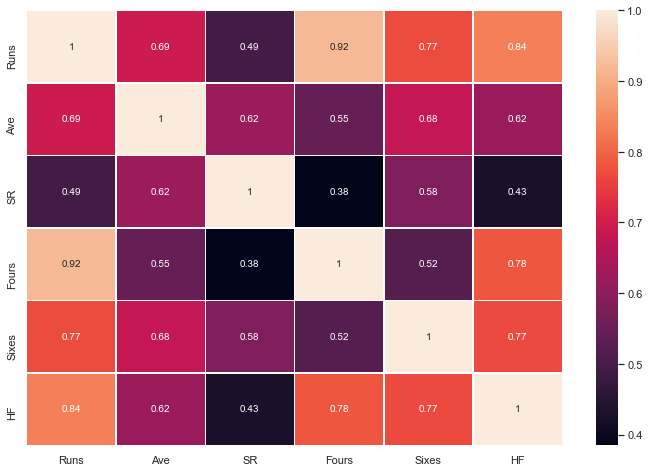

In [1221]:
corr=df4.corr()
fig, ax=plt.subplots(1,1,figsize=(12,8))
sns.heatmap(corr,annot=True, linewidth=.5, ax=ax)

VERY HIGH CORRELATED DATA (|COEF|>=0.9): 

[VERY HIGH CORRELATION] Runs and Fours : 0.91880860633387


VERY HIGH CORRELATED DATA (|COEF|>0.8 and <0.9): 

[HIGH CORRELATION]Runs and HF have high correlation of : 0.8351477368906668
                

**AS we can see few correlation between features, we can use PCA to remove dimension further**

### 2. Build a data driven model to rank all the players in the dataset using all or the most important performance features.

**Methods To be Used :**

1. Grouping using K mean 
2. Ranking the players using PCA

In [1222]:
# independant variables
X = df4.drop(['Name'], axis=1)
X.head()

,Runs,Ave,SR,Fours,Sixes,HF
1,733.0,61.08,160.74,46.0,59.0,9.0
3,590.0,36.87,143.55,64.0,17.0,6.0
5,495.0,33.00,161.23,57.0,19.0,5.0
7,479.0,43.54,149.68,41.0,20.0,5.0
9,569.0,40.64,129.61,58.0,18.0,5.0


In [1223]:
XScaled=X.apply(zscore)
XScaled.head()

,Runs,Ave,SR,Fours,Sixes,HF
1,3.301945,2.683984,1.767325,1.607207,6.462679,4.651551
3,2.381639,0.896390,1.036605,2.710928,1.184173,2.865038
5,1.770248,0.610640,1.788154,2.281703,1.435530,2.269533
7,1.667276,1.388883,1.297182,1.300618,1.561209,2.269533
9,2.246490,1.174755,0.444038,2.343021,1.309851,2.269533


## Grouping using K mean

,num_clusters,cluster_errors
0,1,2.085496
1,2,1.541286
2,3,1.379577
3,4,1.229660
4,5,1.161838
5,6,1.047651
6,7,0.926327
7,8,0.888248
8,9,0.823937


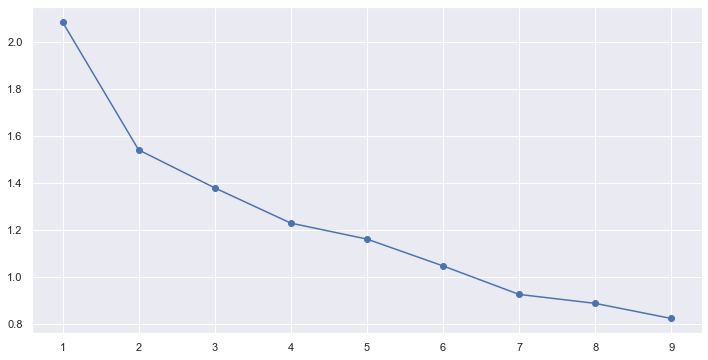

In [1224]:
def kmean_clustering(data):
    cluster_range = range(1,10)
    cluster_errors = []
    for num_clusters in cluster_range:
        clusters = KMeans(num_clusters)
        clusters.fit(data)
        labels = clusters.labels_
        cluster_errors.append(sum(np.min(cdist(data, clusters.cluster_centers_, 'euclidean'), axis=1)) / data.shape[0])


    clusters_df = pd.DataFrame({"num_clusters": cluster_range, "cluster_errors": cluster_errors})
    display(clusters_df[0:10])
    plt.figure(figsize=(12,6))
    plt.plot( clusters_df.num_clusters, clusters_df.cluster_errors, marker = "o" )
kmean_clustering(XScaled)


## Ranking the players using PCA

In [1225]:
covMatrix = np.cov(XScaled,rowvar=False)
print(covMatrix)

[[1.01123596 0.70077082 0.49903347 0.9291323  0.77842677 0.84453142]
 [0.70077082 1.01123596 0.63061271 0.55234856 0.69008186 0.62772842]
 [0.49903347 0.63061271 1.01123596 0.38913406 0.59050396 0.43238784]
 [0.9291323  0.55234856 0.38913406 1.01123596 0.52844526 0.79249429]
 [0.77842677 0.69008186 0.59050396 0.52844526 1.01123596 0.77632221]
 [0.84453142 0.62772842 0.43238784 0.79249429 0.77632221 1.01123596]]


**Lets start with 6 dimension**

In [1226]:
pca = PCA(n_components=6)
pca.fit(XScaled)

PCA(n_components=6)

In [1227]:
print(pca.explained_variance_)

[4.30252561 0.83636692 0.41665751 0.32912443 0.16567829 0.01706297]


In [1228]:
print(pca.components_)

[[ 0.4582608   0.39797313  0.3253838   0.40574167  0.41733459  0.43237178]
 [ 0.26643209 -0.33111756 -0.69780334  0.47355804 -0.17902455  0.27593225]
 [-0.10977942  0.00550486 -0.45013448 -0.50823538  0.66942589  0.28082541]
 [-0.00520142  0.84736307 -0.43275029 -0.03252305 -0.24878157 -0.17811777]
 [ 0.45840889 -0.10122837 -0.11890348  0.09676885  0.39458014 -0.77486668]
 [ 0.70483594 -0.0606373   0.05624934 -0.58514214 -0.35786211  0.16096217]]


In [1229]:
print(pca.explained_variance_ratio_)

[0.70911996 0.13784566 0.06867133 0.05424458 0.02730624 0.00281223]


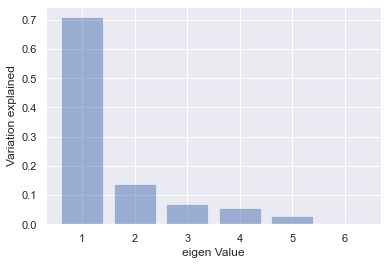

In [1230]:
plt.bar(list(range(1,7)),pca.explained_variance_ratio_,alpha=0.5, align='center')
plt.ylabel('Variation explained')
plt.xlabel('eigen Value')
plt.show()

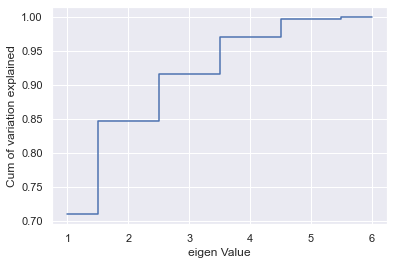

In [1231]:
plt.step(list(range(1,7)),np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.ylabel('Cum of variation explained')
plt.xlabel('eigen Value')
plt.show()

### Dimensionality Reduction
Now 4 dimensions seems very reasonable. With 4 variables we can explain over 95% of the variation in the original data.

In [1232]:
pca4 = PCA(n_components=4)
pca4.fit(XScaled)
print(pca4.components_)
print(pca4.explained_variance_ratio_)
Xpca4 = pca4.transform(XScaled)

[[ 0.4582608   0.39797313  0.3253838   0.40574167  0.41733459  0.43237178]
 [ 0.26643209 -0.33111756 -0.69780334  0.47355804 -0.17902455  0.27593225]
 [-0.10977942  0.00550486 -0.45013448 -0.50823538  0.66942589  0.28082541]
 [-0.00520142  0.84736307 -0.43275029 -0.03252305 -0.24878157 -0.17811777]]
[0.70911996 0.13784566 0.06867133 0.05424458]


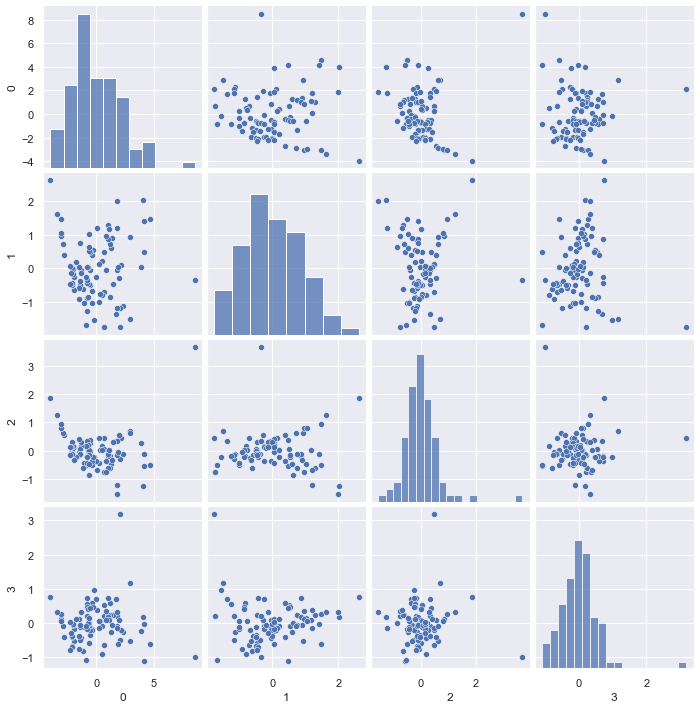

In [1233]:
sns.pairplot(pd.DataFrame(Xpca4))


In [1234]:
pca_data = pd.DataFrame(Xpca4)
pca_data.head()

,0,1,2,3
0,8.516774,-0.354575,3.672474,-0.996267
1,4.618340,1.476730,-0.503630,-0.594494
2,4.142251,0.471438,-0.557204,-1.101184
3,3.899411,0.041816,0.262143,-0.228085
4,4.120072,1.401002,-0.116643,-0.014712


In [1235]:
pca_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90 entries, 0 to 89
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       90 non-null     float64
 1   1       90 non-null     float64
 2   2       90 non-null     float64
 3   3       90 non-null     float64
dtypes: float64(4)
memory usage: 2.9 KB


In [1236]:
pca_data["Performance score"] = pca_data[[0,1,2,3]].sum(axis=1)
pca_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90 entries, 0 to 89
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   0                  90 non-null     float64
 1   1                  90 non-null     float64
 2   2                  90 non-null     float64
 3   3                  90 non-null     float64
 4   Performance score  90 non-null     float64
dtypes: float64(5)
memory usage: 3.6 KB


In [1237]:
df4.reset_index(drop=True)

,Name,Runs,Ave,SR,Fours,Sixes,HF
0,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0
1,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0
2,V Sehwag,495.0,33.00,161.23,57.0,19.0,5.0
3,CL White,479.0,43.54,149.68,41.0,20.0,5.0
4,S Dhawan,569.0,40.64,129.61,58.0,18.0,5.0
...,...,...,...,...,...,...,...
85,Z Khan,12.0,6.00,70.58,1.0,0.0,0.0
86,WD Parnell,19.0,4.75,70.37,2.0,0.0,0.0
87,PC Valthaty,30.0,5.00,58.82,4.0,0.0,0.0
88,RP Singh,6.0,3.00,50.00,0.0,0.0,0.0


In [1238]:
df4 = df4.reset_index(drop=True)
df4["Performance score"] = pca_data["Performance score"]
df4.head(10)

,Name,Runs,Ave,SR,Fours,Sixes,HF,Performance score
0,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0,10.838406
1,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0,4.996945
2,V Sehwag,495.0,33.00,161.23,57.0,19.0,5.0,2.955301
3,CL White,479.0,43.54,149.68,41.0,20.0,5.0,3.975285
4,S Dhawan,569.0,40.64,129.61,58.0,18.0,5.0,5.389718
5,AM Rahane,560.0,40.00,129.33,73.0,10.0,5.0,4.974729
6,KP Pietersen,305.0,61.00,147.34,22.0,20.0,3.0,3.242753
7,RG Sharma,433.0,30.92,126.60,39.0,18.0,5.0,3.962186
8,AB de Villiers,319.0,39.87,161.11,26.0,15.0,3.0,0.796928
9,JP Duminy,244.0,81.33,128.42,13.0,11.0,2.0,3.978450


In [1239]:
df4.sort_values('Performance score', ascending=False)

,Name,Runs,Ave,SR,Fours,Sixes,HF,Performance score
0,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0,10.838406
4,S Dhawan,569.0,40.64,129.61,58.0,18.0,5.0,5.389718
1,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0,4.996945
5,AM Rahane,560.0,40.00,129.33,73.0,10.0,5.0,4.974729
9,JP Duminy,244.0,81.33,128.42,13.0,11.0,2.0,3.978450
...,...,...,...,...,...,...,...,...
76,A Ashish Reddy,35.0,8.75,120.68,3.0,1.0,0.0,-3.359192
77,DL Vettori,31.0,7.75,119.23,3.0,1.0,0.0,-3.365424
72,R Bhatia,35.0,11.66,125.00,4.0,0.0,0.0,-3.454153
81,R Ashwin,18.0,6.00,120.00,2.0,0.0,0.0,-3.679940


## CONCLUSION

**As above we have sorted the based on performance score which using 4 dimension after PCA.**

**With 4 variables we can explain over 95% of the variation in the original data.**

**After sorting the players we can see that the data are failrly good in predicting the performance of a player.**

**For Eg :**

    CH Gayle has very high run, avg, SR, Fours, Sixes and HF
    
    S Dhawan has next to CH Gayle's records which justifies the ranking

====================================================================================================================
# END PART FOUR
====================================================================================================================

====================================================================================================================
# PART FIVE 
====================================================================================================================

**• Questions:** 

**1. List down all possible dimensionality reduction techniques that can be implemented using python.**

**2. So far you have used dimensional reduction on numeric data. Is it possible to do the same on a multimedia data [images and video] and text data ? Please illustrate your findings using a simple implementation on python.**


## ANSWERS
**Q1. List down all possible dimensionality reduction techniques that can be implemented using python.**

**ANS Q1:**
    
    Find Combination of new features:
        Linear methods :  
            Principal Component Analysis (PCA)
            Factor Analysis (FA)
            Linear Discriminant Analysis (LDA)
            Truncated Singular Value Decomposition (SVD)

        Non-linear methods (Manifold learning) :
            Kernel PCA
            t-distributed Stochastic Neighbor Embedding (t-SNE)
            Multidimensional Scaling (MDS)
            Isometric mapping (Isomap)
            Generalized discriminant analysis (GDA)

    Only Keep the important features:
            Backward Elimination
            Forward Selection
            Random forests
            
            
            
**Q2. So far you have used dimensional reduction on numeric data. Is it possible to do the same on a multimedia data [images and video] and text data ? Please illustrate your findings using a simple implementation on python.**

**ANS Q2:**

      **STEPS:**
        1. Import images into python using PIL or any other python image library
        2. Display the image - actual
        3. Display the image - matrix (hint: Image is a MXN matrix of number )
        4. SL algorithms require a MxN dataframe to classify. Whereas here a single image is MxN, hence making it difficult for SL algorithm to intake data.
        solution: Flatten each image i.e. MxN ---> 1X(M*N)
        5. Apply SL algorithm like KNN or SVM or any other algorithm of your choice. Note the accuracy (A1)
        6. Use the image matrix to perform pPCA on it.
        7. Apply the same SL algorithm as used above on the dimensionally reduced data . Note the accuracy (A2)
        8. Compare A1 ~ A2. If they are similar then dimesional reduction has worked on image.

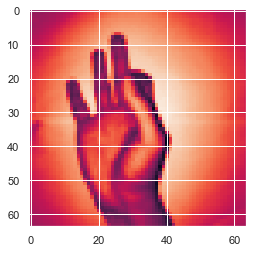

In [1240]:
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier


X = np.load('X.npy')
Y = np.load('Y.npy')

X.shape
plt.imshow(X[0])




In [1241]:
X_flat = np.array(X).reshape((2062, 64*64))

X_train, X_test, y_train, y_test = train_test_split(X_flat, Y, test_size=0.3, random_state=42)

In [1242]:
KNN = KNeighborsClassifier(n_neighbors = 4)
KNN.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=4)

In [1243]:
y_hat = KNN.predict(X_test)

print("accuracy: " + str(accuracy_score(y_test, y_hat)))

accuracy: 0.4878836833602585


In [1244]:
pca_dims = PCA()
pca_dims.fit(X_train)
cumsum = np.cumsum(pca_dims.explained_variance_ratio_)
d = np.argmax(cumsum >= 0.95) + 1
d

292

In [1245]:
pca = PCA(n_components=d)
X_reduced = pca.fit_transform(X_train)
X_recovered = pca.inverse_transform(X_reduced)

In [1246]:
print("reduced shape: " + str(X_reduced.shape))
print("recovered shape: " + str(X_recovered.shape))

reduced shape: (1443, 292)
recovered shape: (1443, 4096)


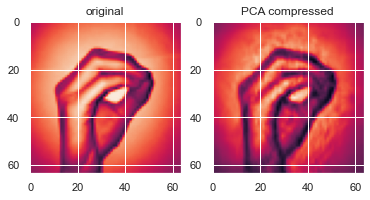

In [1247]:
f = plt.figure()
f.add_subplot(1,2, 1)
plt.title("original")
plt.imshow(X_train[0].reshape((64,64)))
f.add_subplot(1,2, 2)

plt.title("PCA compressed")
plt.imshow(X_recovered[0].reshape((64,64)))
plt.show(block=True)

In [1248]:
knn_reduced = KNeighborsClassifier(n_neighbors = 4)
knn_reduced.fit(X_reduced, y_train)

KNeighborsClassifier(n_neighbors=4)

In [1249]:
X_test_reduced = pca.transform(X_test)

y_hat_reduced = knn_reduced.predict(X_test_reduced)

print("accuracy: " + str(accuracy_score(y_test, y_hat_reduced)))

accuracy: 0.4927302100161551


## CONCLUSION : 

**After comparison before and after compression and comparing the accuracies, we can see that we have compressed the image with PCA and the accuracy is similar and higher side.**

**They are similar and dimensional reduction has worked on image.**

**With the given illustration we have demostrated the use of dimensional reduction on multimedia data like image.**

====================================================================================================================
# END PART FIVE
====================================================================================================================

====================================================================================================================
# END
====================================================================================================================